<p style="align: center;"><img align=center src="https://drive.google.com/uc?export=view&id=1I8kDikouqpH4hf7JBiSYAeNT2IO52T-T" width=600 height=480/></p>
<h3 style="text-align: center;"><b>Школа глубокого обучения ФПМИ МФТИ</b></h3>

<h3 style="text-align: center;"><b>Домашнее задание. Весна 2021</b></h3>

# Autoencoders


# Часть 1. Vanilla Autoencoder (10 баллов)

## 1.1. Подготовка данных (0.5 балла)


In [1]:
!pip install torchinfo
import numpy as np
from torch.autograd import Variable
from torchvision import datasets
from torchvision import transforms
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torch.utils.data as data_utils
import torch
from torchinfo import summary
import matplotlib.pyplot as plt
import os
import pandas as pd
import skimage.io
from skimage.transform import resize
from sklearn.model_selection import train_test_split
from sklearn.manifold import TSNE
from tqdm.notebook import tqdm
from IPython.display import clear_output
%matplotlib inline

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [2]:
def fetch_dataset(attrs_name = "lfw_attributes.txt",
                      images_name = "lfw-deepfunneled",
                      dx=80,dy=80,
                      dimx=64,dimy=64
    ):

    #download if not exists
    if not os.path.exists(images_name):
        print("images not found, donwloading...")
        os.system("wget http://vis-www.cs.umass.edu/lfw/lfw-deepfunneled.tgz -O tmp.tgz")
        print("extracting...")
        os.system("tar xvzf tmp.tgz && rm tmp.tgz")
        print("done")
        assert os.path.exists(images_name)

    if not os.path.exists(attrs_name):
        print("attributes not found, downloading...")
        os.system("wget http://www.cs.columbia.edu/CAVE/databases/pubfig/download/%s" % attrs_name)
        print("done")

    #read attrs
    df_attrs = pd.read_csv("lfw_attributes.txt",sep='\t',skiprows=1,) 
    df_attrs = pd.DataFrame(df_attrs.iloc[:,:-1].values, columns = df_attrs.columns[1:])


    #read photos
    photo_ids = []
    for dirpath, dirnames, filenames in os.walk(images_name):
        for fname in filenames:
            if fname.endswith(".jpg"):
                fpath = os.path.join(dirpath,fname)
                photo_id = fname[:-4].replace('_',' ').split()
                person_id = ' '.join(photo_id[:-1])
                photo_number = int(photo_id[-1])
                photo_ids.append({'person':person_id,'imagenum':photo_number,'photo_path':fpath})

    photo_ids = pd.DataFrame(photo_ids)
    # print(photo_ids)
    #mass-merge
    #(photos now have same order as attributes)
    df = pd.merge(df_attrs,photo_ids,on=('person','imagenum'))

    assert len(df)==len(df_attrs),"lost some data when merging dataframes"

    # print(df.shape)
    #image preprocessing
    all_photos =df['photo_path'].apply(skimage.io.imread)\
                                .apply(lambda img:img[dy:-dy,dx:-dx])\
                                .apply(lambda img: resize(img,[dimx,dimy]))

    all_photos = np.stack(all_photos.values)#.astype('uint8')
    all_attrs = df.drop(["photo_path","person","imagenum"],axis=1)
    
    return all_photos, all_attrs

In [3]:
# The following line fetches you two datasets: images, usable for autoencoder training and attributes.
# Those attributes will be required for the final part of the assignment (applying smiles), so please keep them in mind
data, attrs = fetch_dataset()

images not found, donwloading...
extracting...
done
attributes not found, downloading...
done



Разбейте выборку картинок на train и val, выведите несколько картинок в output, чтобы посмотреть, как они выглядят, и приведите картинки к тензорам pytorch, чтобы можно было скормить их сети:

In [4]:
train_photos, val_photos, train_attr, val_attr = train_test_split(data, attrs, test_size=0.2, shuffle=True)

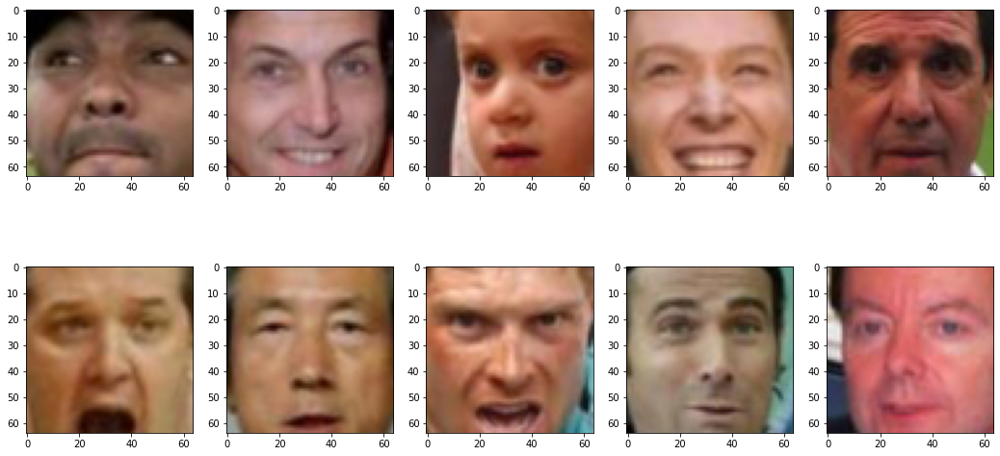

In [5]:
plt.figure(figsize=(18, 9))
random_ind = np.random.randint(low=0, high=train_photos.shape[0]-1, size=10)

for i in range(10):
  plt.subplot(2, 5, i+1)
  plt.imshow(train_photos[random_ind[i]])

In [6]:
train_photos = torch.from_numpy(train_photos).float()
val_photos = torch.from_numpy(val_photos).float()

In [7]:
train_photos.size()

torch.Size([10514, 64, 64, 3])

In [8]:
batch_size = 16
train_loader = data_utils.DataLoader(train_photos, batch_size=batch_size)
val_loader = data_utils.DataLoader(val_photos, batch_size=batch_size)

## 1.2. Архитектура модели (1.5 балла)
В этом разделе мы напишем и обучем обычный автоэнкодер.



<img src="https://www.notion.so/image/https%3A%2F%2Fs3-us-west-2.amazonaws.com%2Fsecure.notion-static.com%2F4b8adf79-8e6a-4b7d-9061-8617a00edbb1%2F__2021-04-30__14.53.33.png?table=block&id=56f187b4-279f-4208-b1ed-4bda5f91bfc0&width=2880&userId=3b1b5e32-1cfb-4b0f-8705-5a524a8f56e3&cache=v2" alt="Autoencoder">


^ напомню, что автоэнкодер выглядит вот так

In [9]:
device = 'cuda:0' if torch.cuda.is_available() else 'cpu'

Реализуем autoencoder. Архитектуру (conv, fully-connected, ReLu, etc) можете выбирать сами. Экспериментируйте!

## WARNING
**В данной работе вы часто встретите частое применение функции permute. Это связано с тем, что matplotlib imshow принмает картинки формата (H, W, C), а сети работают с размером (C, H, W), из-за чего приходится менять размерности. В идеале, конечно, это стоило решить более элегантным методом, однако на данном этапе я плохо знаком с другими графическими библиотеками**

In [10]:
class AutoencoderLinear(nn.Module):
    def __init__(self, features=16):
        super().__init__()

        self.flatten = nn.Flatten(start_dim=1)
        
        self.encoder = nn.Sequential(
            nn.Linear(in_features=(3 * 64 * 64), out_features=512),
            nn.ReLU(),
            nn.Linear(in_features=512, out_features=features)
        )

        self.decoder = nn.Sequential(
            nn.Linear(in_features=features, out_features=512),
            nn.ReLU(),
            nn.Linear(in_features=512, out_features=(3 * 64 * 64))
        )

        
    # реализуйте forward проход автоэнкодера
    def forward(self, x):
        latent_code = self.encoder(self.flatten(x))
        output = self.decoder(latent_code).view(-1, 64, 64, 3)
        reconstruction = torch.sigmoid(output)
        return reconstruction, latent_code
    
    def get_latent_vec(self, x):
        latent_code = self.encoder(self.flatten(x))
        return latent_code
    
    def sample(self, z):
        generated = self.decoder(self.flatten(z))
        generated = torch.sigmoid(generated)
        generated = generated.view(-1, 64, 64, 3)
        return generated

In [11]:
class AutoencoderConv(nn.Module):
    def __init__(self, features=16):
        super().__init__()
        
        self.features = features
        
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 8, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(8, 16, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(16, 32, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(32, 64, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(64, 32, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(32, features, kernel_size=4, stride=2, padding=1)
        )
        
        self.decoder_conv = nn.Sequential(
            nn.ConvTranspose2d(features, 32, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(32, 64, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(64, 32, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(32, 16, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(16, 8, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(8, 3, kernel_size=4, stride=2, padding=1),
        )
        
    def forward(self, x):
        latent_code = self.encoder(x.permute(0, 3, 1, 2))
        output = self.decoder_conv(latent_code)
        reconstruction = torch.sigmoid(output)
        return reconstruction.permute(0, 2, 3, 1), latent_code.flatten()
    
    def get_latent_vec(self, x):
        latent_code = self.encoder(x.permute(0, 3, 1, 2))
        return latent_code.flatten()
    
    def sample(self, latent_code):
        generated = self.decoder_conv(latent_code.unflatten(dim=1,sizes=(self.features, 1, 1)))
        generated = torch.sigmoid(generated)
        return generated.permute(0, 2, 3, 1)

In [12]:
features = 128
criterion = nn.MSELoss()

## 1.3 Обучение (2 балла)

Осталось написать код обучения автоэнкодера. При этом было бы неплохо в процессе иногда смотреть, как автоэнкодер реконструирует изображения на данном этапе обучения. Наример, после каждой эпохи (прогона train выборки через автоэекодер) можно смотреть, какие реконструкции получились для каких-то изображений val выборки.

А, ну еще было бы неплохо выводить графики train и val лоссов в процессе тренировки =)

In [13]:
#<тут Ваш код тренировки автоэнкодера>
def show_intermediate_results(X_val, reconstruction, n_epochs, epoch, train_losses, val_losses, loss_name):
    fig = plt.figure(figsize=(24, 8))
    for i in range(3):
        ax = fig.add_subplot(2, 6, i + 1)
        ax.imshow(X_val[i].squeeze().detach().cpu().numpy(), cmap='gray')
        ax.set_title("Original")
        ax.axis('off')

        ax = fig.add_subplot(2, 6, i + 7)
        ax.imshow(reconstruction[i].squeeze().detach().cpu().numpy(), cmap='gray')
        ax.set_title("Reconstructed")
        ax.axis('off')

    #draw losses
    if(epoch != 0):
            ax = fig.add_subplot(1, 2, 2)
            epochs = np.arange(1, epoch + 2)
            ax.plot(epochs, train_losses, label='train')
            ax.plot(epochs, val_losses, label='val')

            ax.set_title(loss_name)
            ax.set_xlabel('epochs')
            ax.set_ylabel('loss')
            ax.grid()
            ax.legend()

    plt.suptitle(f"{epoch+1} / {n_epochs} - train_loss: {train_losses[-1]:0.5f}, val_loss: {val_losses[-1]:0.5f}")
    plt.show()
    
    return

In [14]:
def train_ae(model, optimizer, loss, n_epochs, train_loader, val_loader):

    train_losses = []
    val_losses = []

    for epoch in range(n_epochs):
        print(f"Epoch #{epoch+1} of {n_epochs}")

        model.train()
        train_loss_per_epoch = []
        for X_train in train_loader:
            X_train = X_train.to(device)
            optimizer.zero_grad()
            pred = model(X_train)[0]
            loss = criterion(pred, X_train)
            loss.backward()
            optimizer.step()
            train_loss_per_epoch.append(loss.detach().cpu().numpy())
        
        train_losses.append(np.mean(train_loss_per_epoch))
        #lr_sched.step()

        model.eval()
        val_loss_per_epoch = []
        with torch.no_grad():
            for X_val in val_loader:
                X_val = X_val.to(device)
                pred = model(X_val)[0]
                loss = criterion(pred, X_val)
                val_loss_per_epoch.append(loss.detach().cpu().numpy())
        val_losses.append(np.mean(val_loss_per_epoch))
        
        clear_output(wait=True)
        show_intermediate_results(X_val, pred, n_epochs, epoch, train_losses, val_losses, "MSE loss")
        
    return (train_losses, val_losses)

Протестируем для линейной (2 или 4 слоя) и свёрточной архитектуры различную размерность латентного пространства. Хочется узнать, может ли достаточно глубокая линейная сетка конкурировать со свёрткой.

### Linear layers

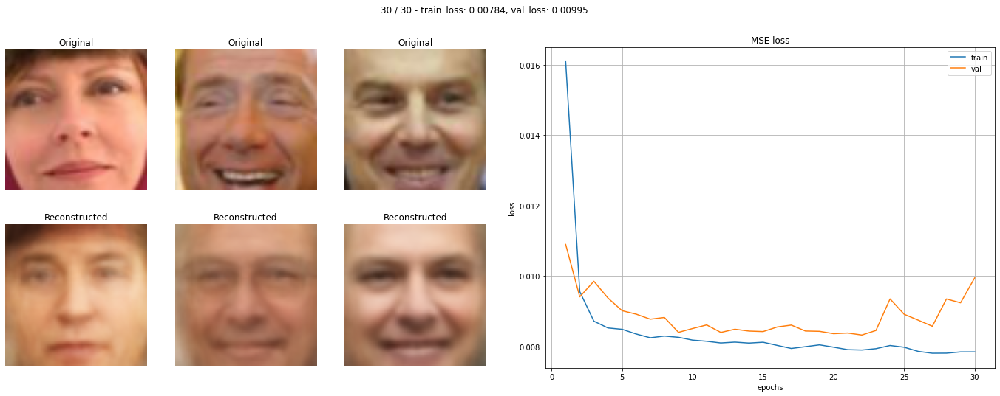

CPU times: user 2min 45s, sys: 3.25 s, total: 2min 48s
Wall time: 3min 3s


In [15]:
%%time
autoencoder_lin = AutoencoderLinear(features).to(device)
optimizer = optim.AdamW(autoencoder_lin.parameters())
losses_lin_train, losses_lin_val = train_ae(autoencoder_lin, optimizer, criterion, 30, train_loader, val_loader)

### Conv layers 

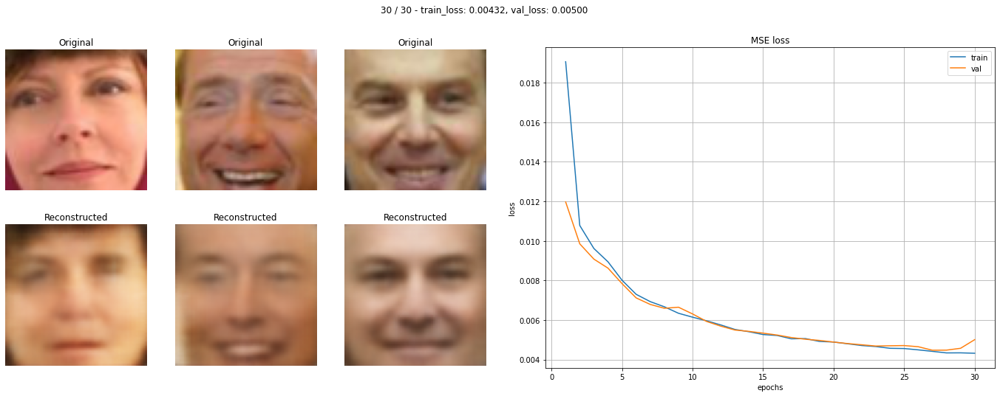

CPU times: user 2min 56s, sys: 1.63 s, total: 2min 57s
Wall time: 2min 59s


In [16]:
%%time
autoencoder_conv = AutoencoderConv(features).to(device)
optimizer = optim.AdamW(autoencoder_conv.parameters())
losses_conv_train, losses_conv_val = train_ae(autoencoder_conv, optimizer, criterion, 30, train_loader, val_loader)

### Пример восстановления картинок conv autoencoder

In [17]:
preds = []
with torch.no_grad():
    for X_val in tqdm(val_loader):
        pred, _ = autoencoder_conv(X_val.to(device))
        preds.extend(pred.cpu().detach().numpy()) 

  0%|          | 0/165 [00:00<?, ?it/s]

In [18]:
def show_reconstruction(num_examples, original, preds, dataset):
    plt.figure(figsize=(24, 8))
    for i in range(num_examples):
        plt.subplot(2, num_examples, i + 1)
        if dataset == 'MNIST':
            plt.imshow(original[i][0].squeeze().detach().numpy())
        else:
            plt.imshow(original[i].detach().numpy())
        plt.title("Original")
        plt.axis('off')

        plt.subplot(2, num_examples, i + 1 + num_examples)
        plt.imshow(preds[i].squeeze())
        plt.title("Reconstructed")
        plt.axis('off')
    plt.suptitle("Validation")
    plt.show()

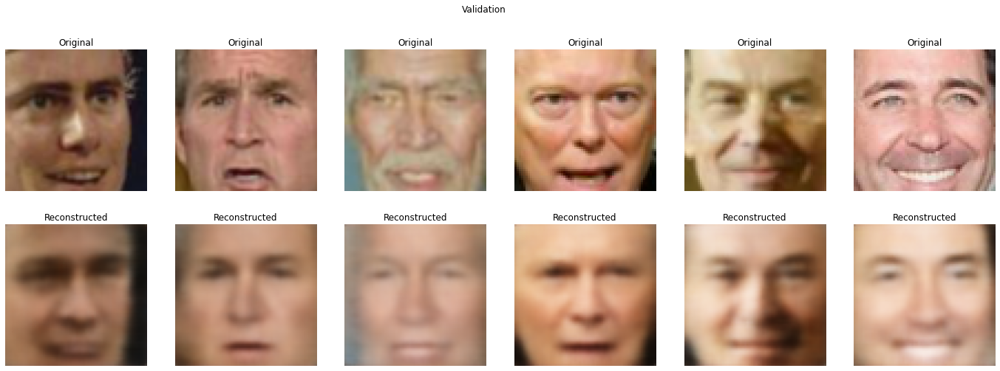

In [19]:
#< тут Ваш код: выведите первые Х картинок и их реконструкций из val выборки на экран>
show_reconstruction(6, val_photos, preds, None)

### Пример восстановления картинок linear autoencoder

In [20]:
preds = []
with torch.no_grad():
    for X_val in tqdm(val_loader):
        pred, _ = autoencoder_lin(X_val.to(device))
        preds.extend(pred.cpu().detach().numpy()) 

  0%|          | 0/165 [00:00<?, ?it/s]

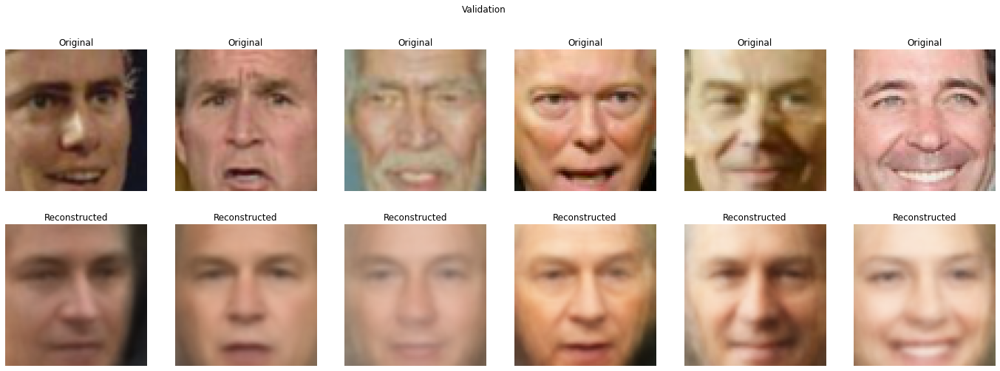

In [21]:
show_reconstruction(6, val_photos, preds, None)

**Как видим, сверточная сеть в разы превосходит любую линейную, поэтому в дальнейшем будем пользоваться именно первой**

## 1.4. Sampling (2 балла)

Давайте теперь будем не просто брать картинку, прогонять ее через автоэекодер и получать реконструкцию, а попробуем создать что-то НОВОЕ

Давайте возьмем и подсунем декодеру какие-нибудь сгенерированные нами векторы (например, из нормального распределения) и посмотрим на результат реконструкции декодера:

__Подсказка:__Е сли вместо лиц у вас выводится непонятно что, попробуйте посмотреть, как выглядят латентные векторы картинок из датасета. Так как в обучении нейронных сетей есть определенная доля рандома, векторы латентного слоя могут быть распределены НЕ как `np.random.randn(25, <latent_space_dim>)`. А чтобы у нас получались лица при запихивании вектора декодеру, вектор должен быть распределен так же, как латентные векторы реальных фоток. Так что в таком случае придется рандом немного подогнать.

### Sampling linear autoencoder

In [22]:
# получим все латентные веткоры для трейна
lat_vecs = torch.zeros((len(train_photos), features))
with torch.no_grad():
    for ind, photo in enumerate(train_photos):
        lat_vec = autoencoder_lin.get_latent_vec(photo.unsqueeze(0).to(device))
        lat_vecs[ind] = (lat_vec.cpu().detach())

In [23]:
# сгенерируем 25 рандомных векторов размера latent_space, подогнав их под распределения на трейне
z = torch.randn(size=(25, features))
z = z * lat_vecs.std(axis=0) + lat_vecs.mean(axis=0)

In [24]:
def show_sampling(num_samples, width, height, n_rows, n_cols, samples, dataset):
    plt.figure(figsize=(width, height))
    for i in range(num_samples):
        plt.subplot(n_rows, n_cols, i + 1)
        plt.imshow(samples[i].squeeze().detach().cpu().numpy())
        plt.axis('off')
    if dataset == "MNIST":
        plt.suptitle("Generated digits")
    else:
        plt.suptitle("Generated faces")
    plt.show()

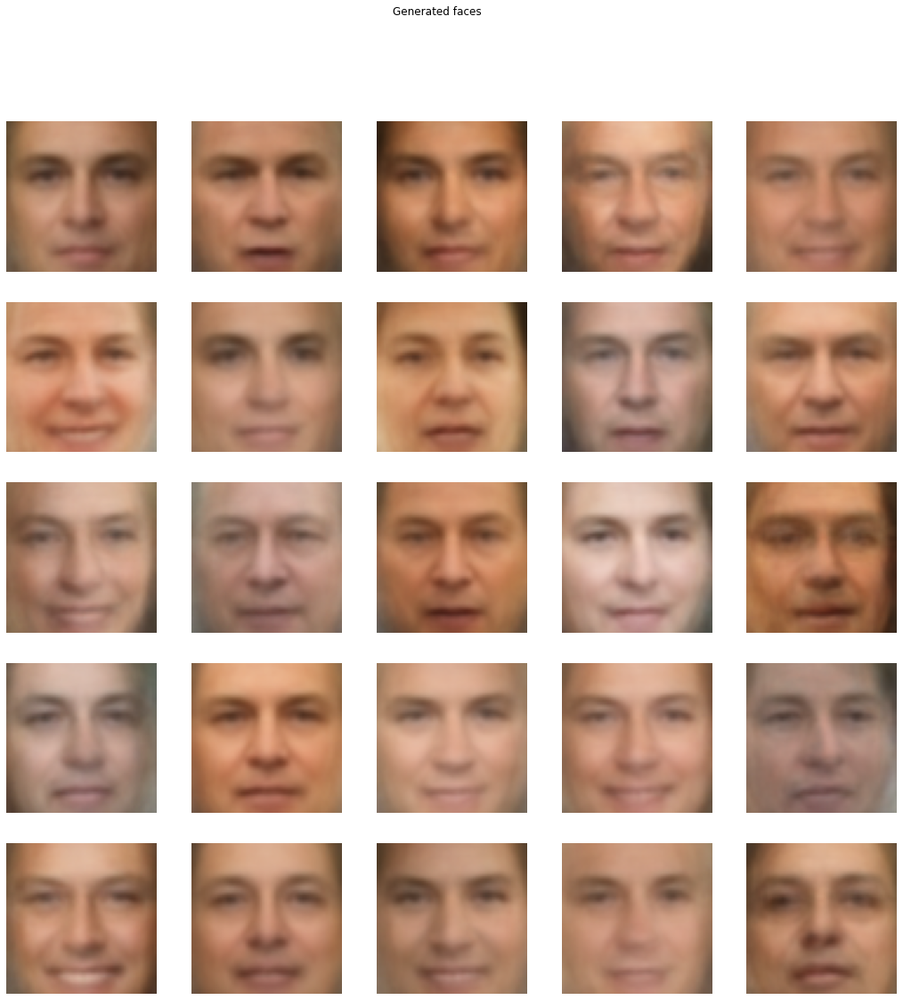

In [25]:
# посмотрим на результат
with torch.no_grad():
    output = autoencoder_lin.sample(z.to(device))

show_sampling(25, 18, 18, 5, 5, output, None)

### Sampling conv autoencoder

In [26]:
# получим все латентные векторы на трейне
lat_vecs = torch.zeros((len(train_photos), features))
with torch.no_grad():
    for ind, photo in enumerate(train_photos):
        lat_vec = autoencoder_conv.get_latent_vec(photo.unsqueeze(0).to(device))
        lat_vecs[ind] = lat_vec.cpu().detach()

In [27]:
# сгенерируем 1000 рандомных векторов размера из стандартного распределения
# и подгоним параметры под латентное про-во
z = torch.randn(25,features) * lat_vecs.std(axis=0) + lat_vecs.mean(axis=0)

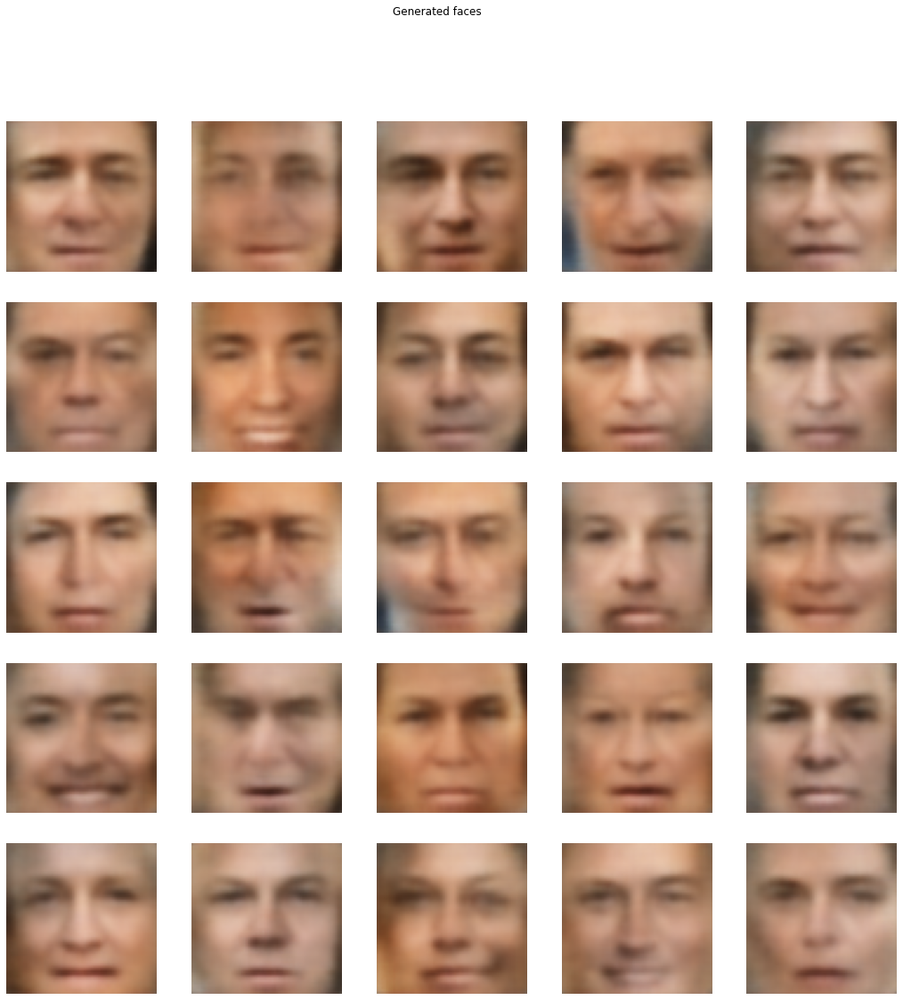

In [28]:
# смотрим на результат
with torch.no_grad():
    output = autoencoder_conv.sample(z.to(device))

show_sampling(25, 18, 18, 5, 5, output, None)

## Time to make fun! (4 балла)

Давайте научимся пририсовывать людям улыбки =)

<img src="https://i.imgur.com/tOE9rDK.png" alt="linear" width="700" height="400">

План такой:

1. Нужно выделить "вектор улыбки": для этого нужно из выборки изображений найти несколько (~15) людей с улыбками и столько же без.

Найти людей с улыбками вам поможет файл с описанием датасета, скачанный вместе с датасетом. В нем указаны имена картинок и присутствубщие атрибуты (улыбки, очки...)

2. Вычислить латентный вектор для всех улыбающихся людей (прогнать их через encoder) и то же для всех грустненьких

3. Вычислить, собственно, вектор улыбки -- посчитать разность между средним латентным вектором улыбающихся людей и средним латентным вектором грустных людей

4. А теперь приделаем улыбку грустному человеку: добавим полученный в пункте 3 вектор к латентному вектору грустного человека и прогоним полученный вектор через decoder. Получим того же человека, но уже не грустненького!

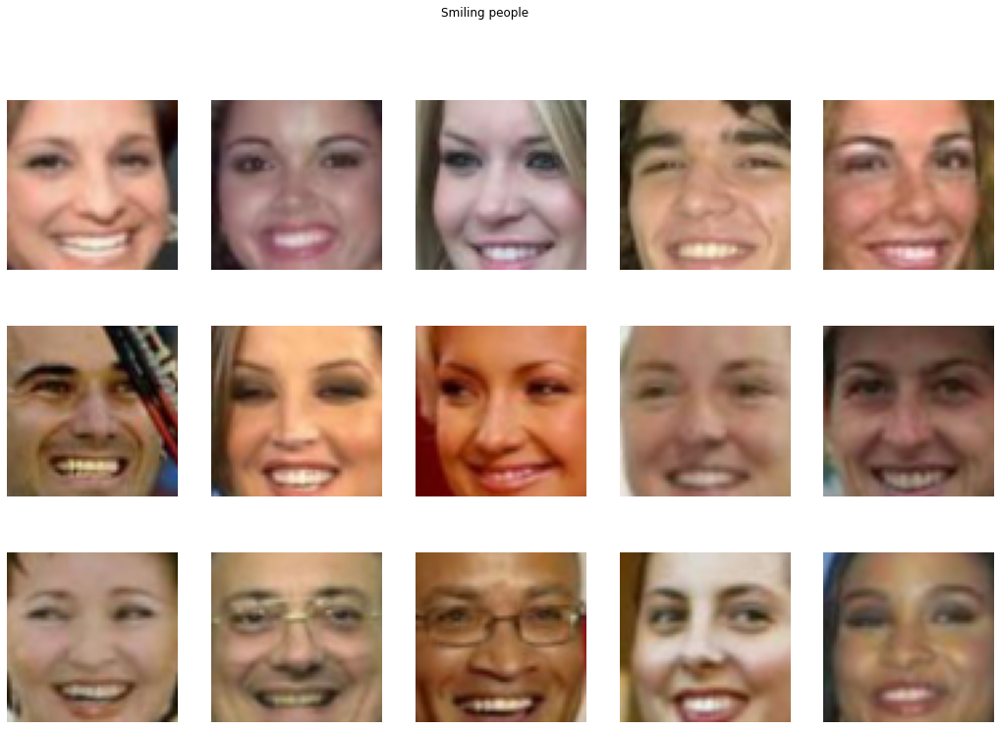

In [29]:
# найдём 25 фотографий с улыбками
smiling_photos = data[list(val_attr.Smiling.sort_values(axis=0, ascending=False)[:15].index)]
not_smiling_photos = data[list(val_attr.Smiling.sort_values(axis=0, ascending=True)[:15].index)]

plt.figure(figsize=(18, 12))
for i in range(15):
    plt.subplot(3, 5, i + 1)
    plt.imshow(smiling_photos[i])
    plt.axis('off')
plt.suptitle("Smiling people")
plt.show()

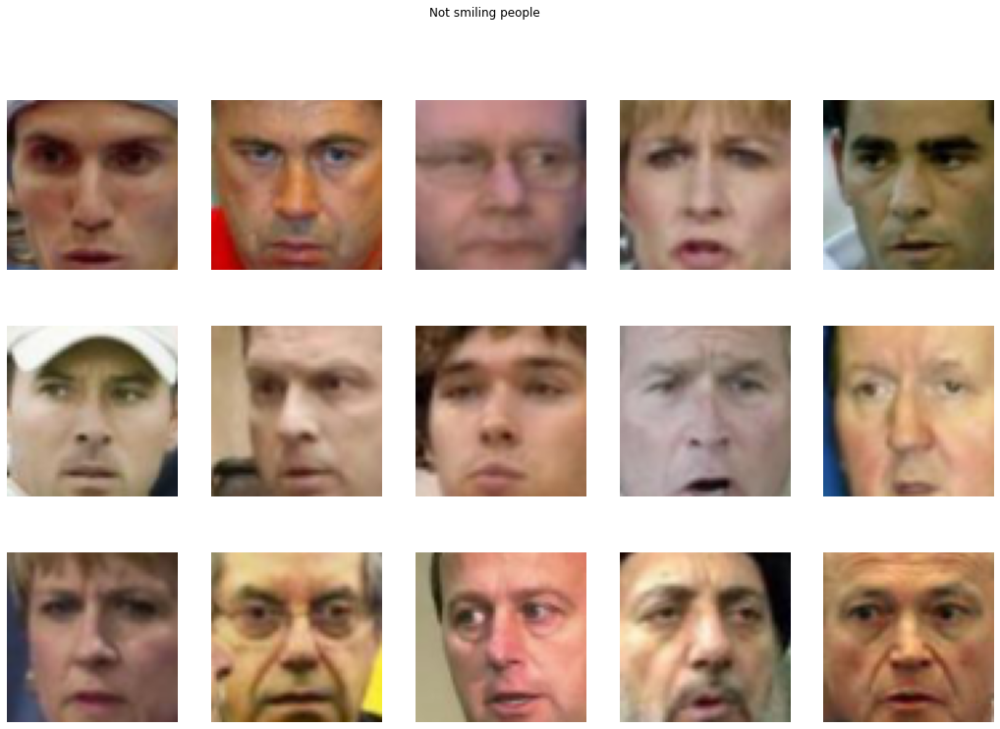

In [30]:
plt.figure(figsize=(18, 12))
for i in range(15):
    plt.subplot(3, 5, i + 1)
    plt.imshow(not_smiling_photos[i])
    plt.axis('off')
plt.suptitle("Not smiling people")
plt.show()

In [31]:
# получим латентные векторы для улыбашек и приунывших
lat_vecs_smiling = torch.zeros((len(smiling_photos), features))
lat_vecs_not_smiling = torch.zeros((len(not_smiling_photos), features))
with torch.no_grad():
    for ind, photo in enumerate(smiling_photos):
        lat_vec = autoencoder_conv.get_latent_vec(torch.FloatTensor(photo).unsqueeze(0).to(device))
        lat_vecs_smiling[ind] = lat_vec.cpu().detach()
    for ind, photo in enumerate(not_smiling_photos):
        lat_vec = autoencoder_conv.get_latent_vec(torch.FloatTensor(photo).unsqueeze(0).to(device))
        lat_vecs_not_smiling[ind] = lat_vec.cpu().detach()

In [32]:
# найдём средний вектор улыбки как разность средего вектора улыбающихся и среднего вектора грустных
smile = lat_vecs_smiling.mean(dim=0) - lat_vecs_not_smiling.mean(dim=0)

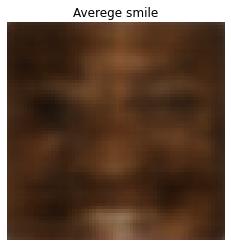

In [33]:
# посмотрим на нашу улыбку
with torch.no_grad():
    output = autoencoder_conv.sample(smile.unsqueeze(0).to(device))

plt.imshow(output.squeeze(0).cpu().numpy())
plt.axis('off')
plt.title("Averege smile")
plt.show()

In [34]:
new_lat_vecs_not_smiling = lat_vecs_not_smiling + smile

with torch.no_grad():
    new_smiling_people = autoencoder_conv.sample(new_lat_vecs_not_smiling.to(device))
    non_smiling_people = autoencoder_conv.sample(lat_vecs_not_smiling.to(device))

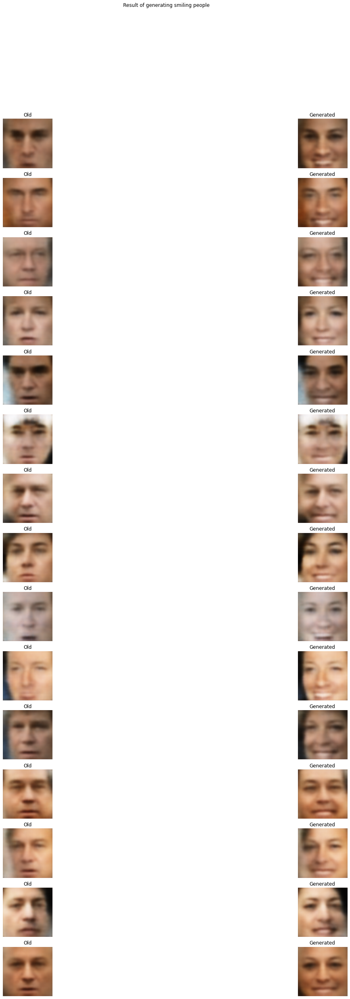

In [35]:
plt.figure(figsize=(24, 40))
for i in range(15):
    plt.subplot(15, 2, 2 * i + 1)
    plt.imshow(non_smiling_people[i].cpu().numpy())
    plt.axis('off')
    plt.title('Old')
    
    plt.subplot(15, 2, 2 * i + 2)
    plt.imshow(new_smiling_people[i].cpu().numpy())
    plt.axis('off')
    plt.title('Generated')
    
plt.suptitle("Result of generating smiling people")
plt.show()

Вуаля! Вы восхитительны!

Теперь вы можете пририсовывать людям не только улыбки, но и много чего другого -- закрывать/открывать глаза, пририсовывать очки... в общем, все, на что хватит фантазии и на что есть атрибуты в `all_attrs`:)

# Часть 2: Variational Autoencoder (10 баллов) 

Займемся обучением вариационных автоэнкодеров — проапгрейженной версии AE. Обучать будем на датасете MNIST, содержащем написанные от руки цифры от 0 до 9

In [36]:
device = 'cuda:0' if torch.cuda.is_available() else 'cpu'

In [37]:
batch_size = 32
# MNIST Dataset
train_dataset = datasets.MNIST(root='./mnist_data/', train=True, transform=transforms.ToTensor(), download=True)
val_dataset = datasets.MNIST(root='./mnist_data/', train=False, transform=transforms.ToTensor(), download=False)

# Data Loader (Input Pipeline)
train_loader = torch.utils.data.DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True)
val_loader = torch.utils.data.DataLoader(dataset=val_dataset, batch_size=batch_size, shuffle=False)

  0%|          | 0/9912422 [00:00<?, ?it/s]

Extracting ./mnist_data/MNIST/raw/train-images-idx3-ubyte.gz to ./mnist_data/MNIST/raw



  0%|          | 0/28881 [00:00<?, ?it/s]

Extracting ./mnist_data/MNIST/raw/train-labels-idx1-ubyte.gz to ./mnist_data/MNIST/raw



  0%|          | 0/1648877 [00:00<?, ?it/s]

Extracting ./mnist_data/MNIST/raw/t10k-images-idx3-ubyte.gz to ./mnist_data/MNIST/raw



  0%|          | 0/4542 [00:00<?, ?it/s]

Extracting ./mnist_data/MNIST/raw/t10k-labels-idx1-ubyte.gz to ./mnist_data/MNIST/raw



## 2.1 Архитектура модели и обучение (2 балла)

Реализуем VAE. Архитектуру (conv, fully-connected, ReLu, etc) можете выбирать сами. Рекомендуем пользоваться более сложными моделями, чем та, что была на семинаре:) Экспериментируйте!

In [38]:
features = 64

In [39]:
class VAEconv(nn.Module):
    def __init__(self, features=16):
        super().__init__()
        
        self.features = features
        
        self.encoder = nn.Sequential(
            nn.Conv2d(1, 8, kernel_size=4, stride=2, padding=3),
            nn.ReLU(),
            nn.Conv2d(8, 16, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(16, 32, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(32, 64, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(64, self.features * 2, kernel_size=4, stride=2, padding=1),
        )
        
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(self.features , 64, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(64, 32, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(32, 16, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(16, 8, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(8, 1, kernel_size=4, stride=2, padding=3),
        )
    def encode(self, x):
        x = self.encoder(x)
        mu = x[:, :self.features].view(-1, self.features)
        logsigma = x[:, self.features:(2 * self.features)].view(-1, self.features)
        
        return mu, logsigma
    
    def gaussian_sampler(self, mu, logsigma):
        if self.training:
            std = torch.exp(0.5 * logsigma)
            eps = torch.randn_like(std)
            return mu + eps * std
        else:
            return mu
    
    def decode(self, z):
        reconstruction = torch.sigmoid(self.decoder(z))
        return reconstruction
    
    def get_latent_vec(self, z):
        mu, logsigma = self.encode(z)
        sample = self.gaussian_sampler(mu, logsigma)
        return sample
    
    def forward(self, x):
        mu, logsigma = self.encode(x)
        sample = self.gaussian_sampler(mu, logsigma)
        reconstruction = self.decode(sample.view(-1, self.features, 1, 1))
        return mu, logsigma, reconstruction

In [40]:
class VAElin(nn.Module):
    def __init__(self, features=16):
        super().__init__()
        
        self.features = features
        
        self.flatten = nn.Flatten(start_dim=1)
        
        self.encoder = nn.Sequential(
            nn.Linear(in_features=(1 * 28 * 28), out_features=256),
            nn.ReLU(),
            nn.Linear(in_features=256, out_features=self.features * 2)
        )

        self.decoder = nn.Sequential(
            nn.Linear(in_features=self.features, out_features=256),
            nn.ReLU(),
            nn.Linear(in_features=256, out_features=(1 * 28 * 28))
        )
        
        self.unflatten = nn.Unflatten(dim=1, unflattened_size=(1, 28, 28))

    def encode(self, x):
        x = self.encoder(x)
        mu, logsigma = torch.split(x, self.features, dim=1)
        return mu, logsigma
    
    def gaussian_sampler(self, mu, logsigma):
        if self.training:
            std = torch.exp(0.5 * logsigma)
            eps = torch.randn_like(std)
            return mu + eps * std
        else:
            return mu
    
    def decode(self, z):
        reconstruction = torch.sigmoid(self.decoder(z))
        return reconstruction
    
    def get_latent_vec(self, z):
        mu, logsigma = self.encode(z)
        sample = self.gaussian_sampler(mu, logsigma)
        return sample

    def forward(self, x):
        mu, logsigma = self.encode(self.flatten(x))
        sample = self.gaussian_sampler(mu, logsigma)
        reconstruction = self.unflatten(self.decode(sample))
        return mu, logsigma, reconstruction

Определим лосс и его компоненты для VAE:

Надеюсь, вы уже прочитали материал в towardsdatascience (или еще где-то) про VAE и знаете, что лосс у VAE состоит из двух частей: KL и log-likelihood.

Общий лосс будет выглядеть так:

$$\mathcal{L} = -D_{KL}(q_{\phi}(z|x)||p(z)) + \log p_{\theta}(x|z)$$

Формула для KL-дивергенции:

$$D_{KL} = -\frac{1}{2}\sum_{i=1}^{dimZ}(1+log(\sigma_i^2)-\mu_i^2-\sigma_i^2)$$

В качестве log-likelihood возьмем привычную нам кросс-энтропию.

In [41]:
def KL_divergence(mu, logsigma):
    """
    часть функции потерь, которая отвечает за "близость" латентных представлений разных людей
    """
    loss = -0.5 * (1 + logsigma - mu.pow(2) - logsigma.exp()).sum()
    return loss

def log_likelihood(x, reconstruction):
    """
    часть функции потерь, которая отвечает за качество реконструкции
    """
    loss = nn.BCELoss(reduction='sum')
    return loss(reconstruction, x)

def loss_vae(x, mu, logsigma, reconstruction):
     return log_likelihood(x, reconstruction) + KL_divergence(mu, logsigma)

И обучим модель:

In [42]:
#<тут Ваш код тренировки автоэнкодера>

def train_vae(model, optimizer, loss, n_epochs, train_loader, val_loader):

    train_losses = []
    val_losses = []

    for epoch in range(n_epochs):
        print(f"Epoch #{epoch+1} of {n_epochs}")

        model.train()
        train_loss_per_epoch = []
        for X_train in train_loader:
            #batch contains a list of [tensor, labels]
            X_train = X_train[0].to(device)
            optimizer.zero_grad()
            mu, logsigma, reconstruction = model(X_train)
            loss = criterion(X_train, mu, logsigma, reconstruction)
            loss.backward()
            optimizer.step()
            train_loss_per_epoch.append(loss.detach().cpu().numpy())
        
        train_losses.append(np.mean(train_loss_per_epoch))
        #lr_sched.step()

        model.eval()
        val_loss_per_epoch = []
        with torch.no_grad():
            for X_val in val_loader:
                #batch contains a list of [tensor, labels]
                X_val = X_val[0].to(device)
                mu, logsigma, reconstruction = model(X_val)
                loss = criterion(X_val, mu, logsigma, reconstruction)
                val_loss_per_epoch.append(loss.detach().cpu().numpy())
        val_losses.append(np.mean(val_loss_per_epoch))
        
        clear_output(wait=True)
        show_intermediate_results(X_val, reconstruction, n_epochs, epoch, train_losses, val_losses, "VAE loss")
        
    return (train_losses, val_losses)

In [43]:
criterion = loss_vae

### Conv VAE

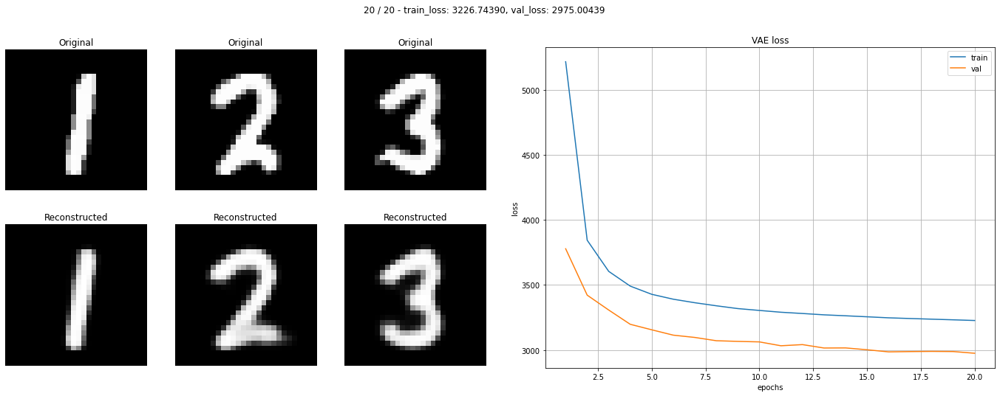

CPU times: user 5min 38s, sys: 2.29 s, total: 5min 40s
Wall time: 5min 40s


In [44]:
%%time
vae_conv = VAEconv(features).to(device)
optimizer = optim.AdamW(vae_conv.parameters())
losses_vae_train, losses_vae_val = train_vae(vae_conv, optimizer, criterion, 20, train_loader, val_loader)

Давайте посмотрим, как наш тренированный VAE кодирует и восстанавливает картинки:

In [45]:
preds = []
with torch.no_grad():
    for X_val in tqdm(val_loader):
        X_val = X_val[0]
        _, _, pred = vae_conv(X_val.to(device))
        preds.extend(pred.cpu().numpy()) 

  0%|          | 0/313 [00:00<?, ?it/s]

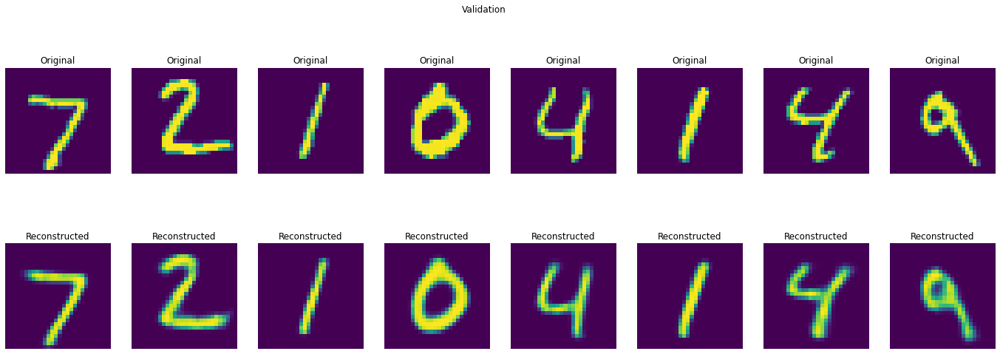

In [46]:
show_reconstruction(8, val_dataset, preds, "MNIST")

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at  ../torch/csrc/utils/tensor_new.cpp:210.)
  """Entry point for launching an IPython kernel.


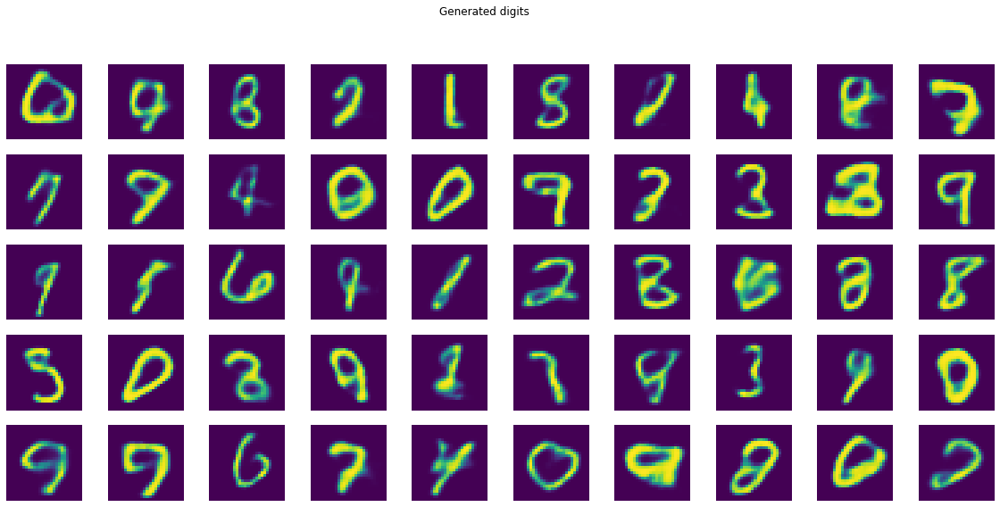

In [47]:
z = torch.FloatTensor([np.random.normal(0, 1, features) for i in range(50)])
output = vae_conv.decode(z.view(-1, features, 1, 1).to(device))
show_sampling(50, 20, 9, 5, 10, output, "MNIST")

### Linear VAE

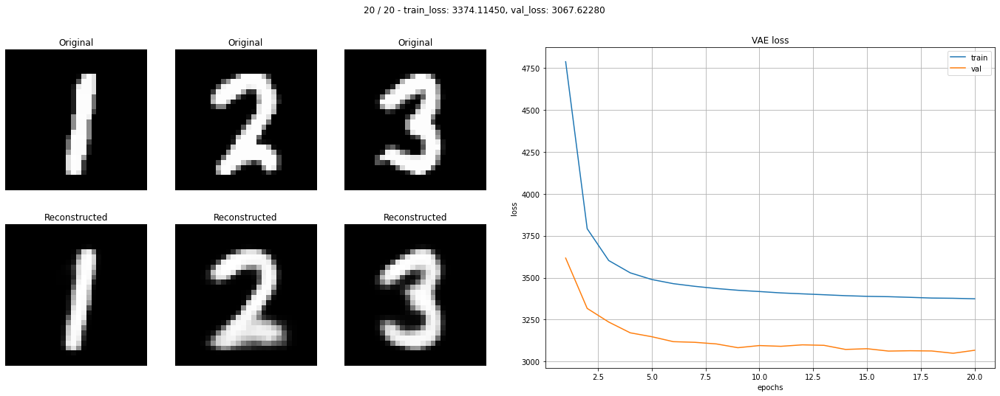

CPU times: user 3min 30s, sys: 2.26 s, total: 3min 32s
Wall time: 3min 32s


In [48]:
%%time
vae_lin = VAElin(features).to(device)
optimizer = optim.AdamW(vae_lin.parameters())
losses_vae_lin_train, losses_vae_lin_val = train_vae(vae_lin, optimizer, criterion, 20, train_loader, val_loader)

In [49]:
preds = []
with torch.no_grad():
    for X_val in tqdm(val_loader):
        X_val = X_val[0]
        _, _, pred = vae_lin(X_val.to(device))
        preds.extend(pred.cpu().numpy()) 

  0%|          | 0/313 [00:00<?, ?it/s]

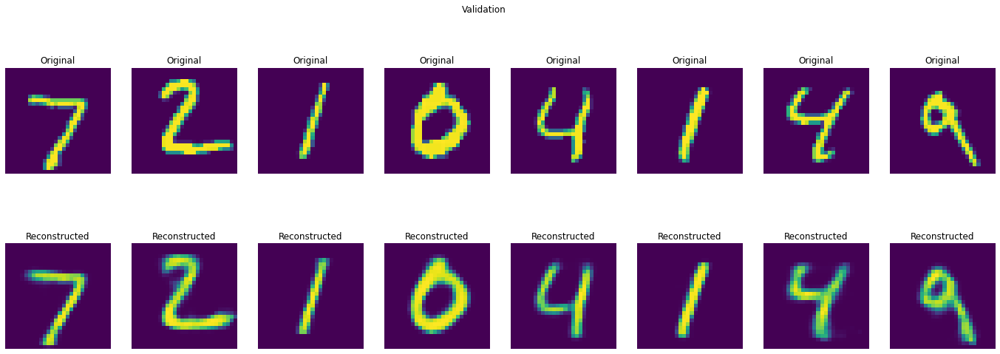

In [50]:
show_reconstruction(8, val_dataset, preds, "MNIST")

Давайте попробуем проделать для VAE то же, что и с обычным автоэнкодером -- подсунуть decoder'у из VAE случайные векторы из нормального распределения и посмотреть, какие картинки получаются:

torch.Size([50, 64])


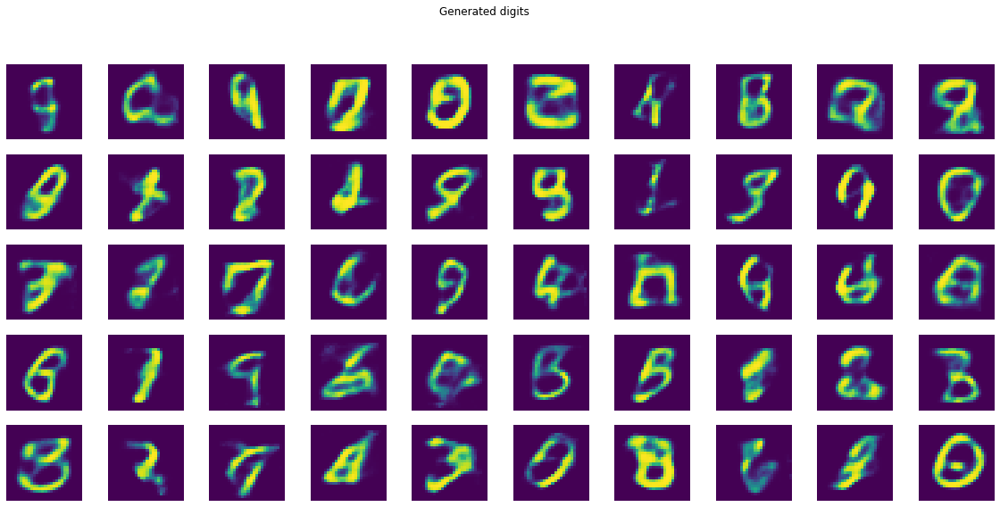

In [51]:
# вспомните про замечание из этого же пункта обычного AE про распределение латентных переменных
z = torch.FloatTensor([np.random.normal(0, 1, features) for i in range(50)]).view(-1, features).to(device)
print(z.size())
output = vae_lin.decode(z).unflatten(1, (1, 28, 28))
show_sampling(50, 20, 9, 5, 10, output, "MNIST")

## 2.2. Latent Representation (2 балла)

Давайте посмотрим, как латентные векторы картинок лиц выглядят в пространстве.
Ваша задача -- изобразить латентные векторы картинок точками в двумерном просторанстве. 

Это позволит оценить, насколько плотно распределены латентные векторы изображений цифр в пространстве. 

Плюс давайте сделаем такую вещь: покрасим точки, которые соответствуют картинкам каждой цифры, в свой отдельный цвет

Подсказка: красить -- это просто =) У plt.scatter есть параметр c (color), см. в документации.


Итак, план:
1. Получить латентные представления картинок тестового датасета
2. С помощтю `TSNE` (есть в `sklearn`) сжать эти представления до размерности 2 (чтобы можно было их визуализировать точками в пространстве)
3. Визуализировать полученные двумерные представления с помощью `matplotlib.scatter`, покрасить разными цветами точки, соответствующие картинкам разных цифр.

### Conv VAE

In [52]:
lat_space_vae_conv = np.zeros((len(val_dataset), features))
lat_labels_vae_conv = np.zeros(len(val_dataset), dtype='int')

vae_conv.eval()
with torch.no_grad():
    for ind, X_val in enumerate(val_dataset):
        mu, logsigma = vae_conv.encode(X_val[0].unsqueeze(0).to(device))
        lat_vec = vae_conv.gaussian_sampler(mu, logsigma).cpu().numpy()
        lat_space_vae_conv[ind] = lat_vec
        lat_labels_vae_conv[ind] = X_val[1]

In [53]:
lat_space_embedded_vae_conv = TSNE(n_components=2).fit_transform(lat_space_vae_conv)
print(lat_space_embedded_vae_conv.shape)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


(10000, 2)


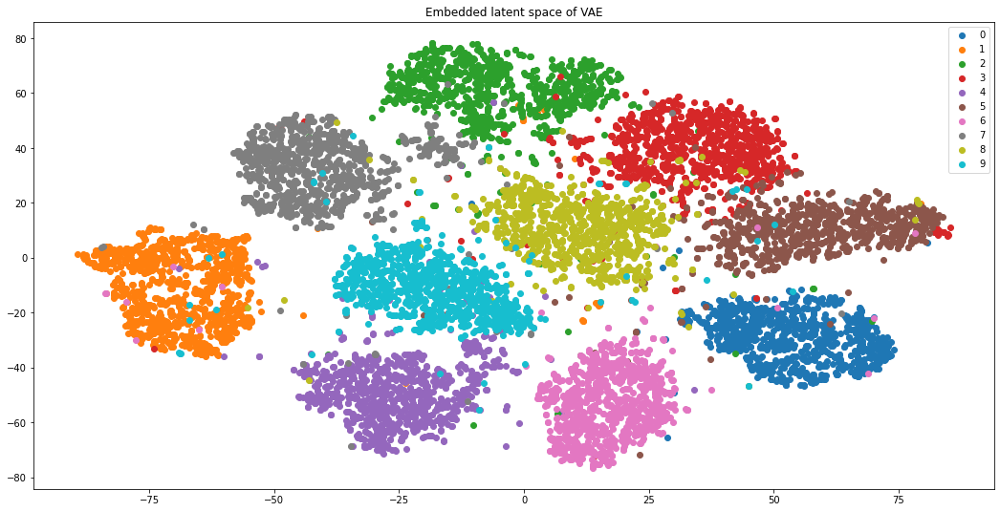

In [54]:
plt.figure(figsize=(18, 9))
for i in range(10):
    indices = lat_labels_vae_conv == i
    plt.scatter(x=lat_space_embedded_vae_conv[indices, 0], y=lat_space_embedded_vae_conv[indices, 1], label=str(i))
plt.title('Embedded latent space of VAE')
plt.legend()
plt.show()

Что вы думаете о виде латентного представления? 
**Выборки хорошо отделимы, однако между ними находятся значемые пробелы**

### Linear VAE

In [55]:
lat_space_vae_lin = np.zeros((len(val_dataset), features))
lat_labels_vae_lin = np.zeros(len(val_dataset), dtype='int')

vae_lin.eval()
with torch.no_grad():
    for ind, X_val in enumerate(val_dataset):
        mu, logsigma = vae_lin.encode(X_val[0].flatten(start_dim=1).to(device))
        lat_vec = vae_lin.gaussian_sampler(mu, logsigma).cpu().numpy()
        lat_space_vae_lin[ind] = lat_vec
        lat_labels_vae_lin[ind] = X_val[1]

In [56]:
lat_space_embedded_vae_lin = TSNE(n_components=2).fit_transform(lat_space_vae_lin)
print(lat_space_embedded_vae_lin.shape)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


(10000, 2)


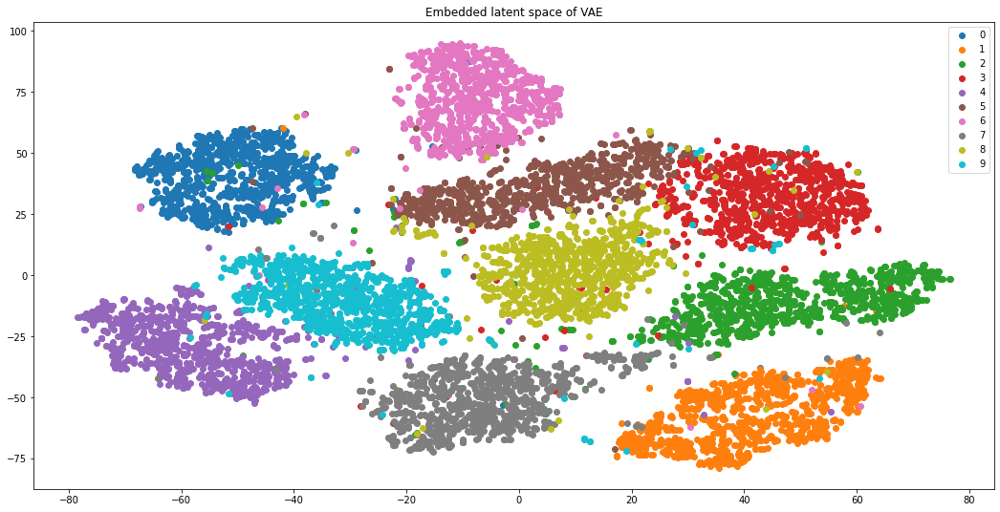

In [57]:
plt.figure(figsize=(18, 9))
for i in range(10):
    indices = lat_labels_vae_lin == i
    plt.scatter(x=lat_space_embedded_vae_lin[indices, 0], y=lat_space_embedded_vae_lin[indices, 1], label=str(i))
plt.title('Embedded latent space of VAE')
plt.legend()
plt.show()

__Congrats v2.0!__

## 2.3. Conditional VAE (6 баллов)


Мы уже научились обучать обычный AE на датасете картинок и получать новые картинки, используя генерацию шума и декодер. 
Давайте теперь допустим, что мы обучили AE на датасете MNIST и теперь хотим генерировать новые картинки с числами с помощью декодера (как выше мы генерили рандомные лица). 
И вот нам понадобилось сгенерировать цифру 8, и мы подставляем разные варианты шума, но восьмерка никак не генерится:(

Хотелось бы добавить к нашему AE функцию "выдай мне рандомное число из вот этого вот класса", где классов десять (цифры от 0 до 9 образуют десять классов).  Conditional AE — так называется вид автоэнкодера, который предоставляет такую возможность. Ну, название "conditional" уже говорит само за себя.

И в этой части задания мы научимся такие обучать.

### Архитектура

На картинке ниже представлена архитектура простого Conditional VAE.

По сути, единственное отличие от обычного -- это то, что мы вместе с картинкой в первом слое энкодера и декодера передаем еще информацию о классе картинки. 

То есть, в первый (входной) слой энкодера подается конкатенация картинки и информации о классе (например, вектора из девяти нулей и одной единицы). В первый слой декодера подается конкатенация латентного вектора и информации о классе.


![alt text](https://sun9-63.userapi.com/impg/Mh1akf7mfpNoprrSWsPOouazSmTPMazYYF49Tw/djoHNw_9KVA.jpg?size=1175x642&quality=96&sign=e88baec5f9bb91c8443fba31dcf0a4df&type=album)

![alt text](https://sun9-73.userapi.com/impg/UDuloLNKhzTBYAKewgxke5-YPsAKyGOqA-qCRg/MnyCavJidxM.jpg?size=1229x651&quality=96&sign=f2d21bfacc1c5755b76868dc4cfef39c&type=album)



На всякий случай: это VAE, то есть, latent у него все еще состоит из mu и sigma

Таким образом, при генерации новой рандомной картинки мы должны будем передать декодеру сконкатенированные латентный вектор и класс картинки.

P.S. Также можно передавать класс картинки не только в первый слой, но и в каждый слой сети. То есть на каждом слое конкатенировать выход из предыдущего слоя и информацию о классе.

In [58]:
class CVAEconv(nn.Module):
    def __init__(self, features=16):
        super().__init__()
        
        self.features = features
        
        self.encoder = nn.Sequential(
            nn.Conv2d(1, 8, kernel_size=4, stride=2, padding=3),
            nn.ReLU(),
            nn.Conv2d(8, 16, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(16, 32, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(32, 64, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(64, self.features * 2, kernel_size=4, stride=2, padding=1),
        )
        
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(self.features + 10, 64, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(64, 32, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(32, 16, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(16, 8, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(8, 1, kernel_size=4, stride=2, padding=3),
        )
    def one_hot(self, class_num):
        shape = class_num.size()[0]
        num_arr = torch.zeros(shape, 10)
        for i in range(shape):
            num_arr[i, class_num[i]] = 1
        return num_arr.view(-1, 10, 1, 1).to(device)
            
    # для свёрточной сети не представляется возможным прогонять one_hot вектор, поэтому будет конкатенировать его на этапе декодинга
    def encode(self, x):
        x = self.encoder(x)
        mu = x[:, :self.features].view(-1, self.features)
        logsigma = x[:, self.features:(2 * self.features)].view(-1, self.features)
        return mu, logsigma
    
    def gaussian_sampler(self, mu, logsigma):
        if self.training:
            std = torch.exp(0.5 * logsigma)
            eps = torch.randn_like(std)
            return mu + eps * std        
        else:
            return mu
    
    def decode(self, z, class_num):
        z = torch.cat((z, class_num), dim=1)
        reconstruction = torch.sigmoid(self.decoder(z))
        return reconstruction
            
    def forward(self, x, class_num):
        mu, logsigma = self.encode(x)
        sample = self.gaussian_sampler(mu, logsigma)
        reconstruction = self.decode(sample.view(-1, self.features, 1, 1), self.one_hot(class_num))
        return mu, logsigma, reconstruction

In [59]:
class CVAElin(nn.Module):
    def __init__(self, features=16):
        super().__init__()
        
        self.features = features
        
        self.flatten = nn.Flatten(start_dim=1)
        
        self.encoder = nn.Sequential(
            nn.Linear(in_features=(1 * 28 * 28), out_features=256),
            nn.ReLU(),
            nn.Linear(in_features=256, out_features=self.features * 2)
        )

        self.decoder = nn.Sequential(
            nn.Linear(in_features=self.features + 10, out_features=256),
            nn.ReLU(),
            nn.Linear(in_features=256, out_features=(1 * 28 * 28))
        )
        
        self.unflatten = nn.Unflatten(dim=1, unflattened_size=(1, 28, 28))
        
    def one_hot(self, class_num):
        shape = class_num.size()[0]
        num_arr = torch.zeros(shape, 10)
        for i in range(shape):
            num_arr[i, class_num[i]] = 1
        return num_arr.to(device)
            
    # для свёрточной сети не представляется возможным прогонять one_hot вектор, поэтому будет конкатенировать его на этапе декодинга
    def encode(self, x):
        x = self.encoder(x)
        mu = x[:, :self.features].view(-1, self.features)
        logsigma = x[:, self.features:(2 * self.features)].view(-1, self.features)
        return mu, logsigma
    
    def gaussian_sampler(self, mu, logsigma):
        if self.training:
            std = torch.exp(0.5 * logsigma)
            eps = torch.randn_like(std)
            return mu + eps * std        
        else:
            return mu
    
    def decode(self, z, class_num):
        z = torch.cat((z, class_num), dim=1)
        reconstruction = torch.sigmoid(self.decoder(z))
        return reconstruction
            
    def forward(self, x, class_num):
        mu, logsigma = self.encode(self.flatten(x))
        sample = self.gaussian_sampler(mu, logsigma)
        reconstruction = self.decode(sample, self.one_hot(class_num)).view(-1, 1, 28, 28)
        return mu, logsigma, reconstruction

In [60]:
def train_cvae(model, optimizer, loss, n_epochs, train_loader, val_loader):

    train_losses = []
    val_losses = []

    for epoch in range(n_epochs):
        print(f"Epoch #{epoch+1} of {n_epochs}")

        model.train()
        train_loss_per_epoch = []
        for X_train in train_loader:
            X_train, class_num = X_train[0].to(device), X_train[1].to(device)
            optimizer.zero_grad()
            mu, logsigma, reconstruction = model(X_train, class_num)
            loss = criterion(X_train, mu, logsigma, reconstruction)
            loss.backward()
            optimizer.step()
            train_loss_per_epoch.append(loss.detach().cpu().numpy())
        
        train_losses.append(np.mean(train_loss_per_epoch))
        #lr_sched.step()

        model.eval()
        val_loss_per_epoch = []
        with torch.no_grad():
            for X_val in val_loader:
                #batch contains a list of [tensor, labels]
                X_val, class_num = X_val[0].to(device), X_val[1].to(device)
                mu, logsigma, reconstruction = model(X_val, class_num)
                loss = criterion(X_val, mu, logsigma, reconstruction)
                val_loss_per_epoch.append(loss.detach().cpu().numpy())
        val_losses.append(np.mean(val_loss_per_epoch))
        
        #show intermediate predictions
        clear_output(wait=True)
        show_intermediate_results(X_val, reconstruction, n_epochs, epoch, train_losses, val_losses, "VAE loss")
    
    return (train_losses, val_losses)

In [61]:
criterion = loss_vae
features = 16

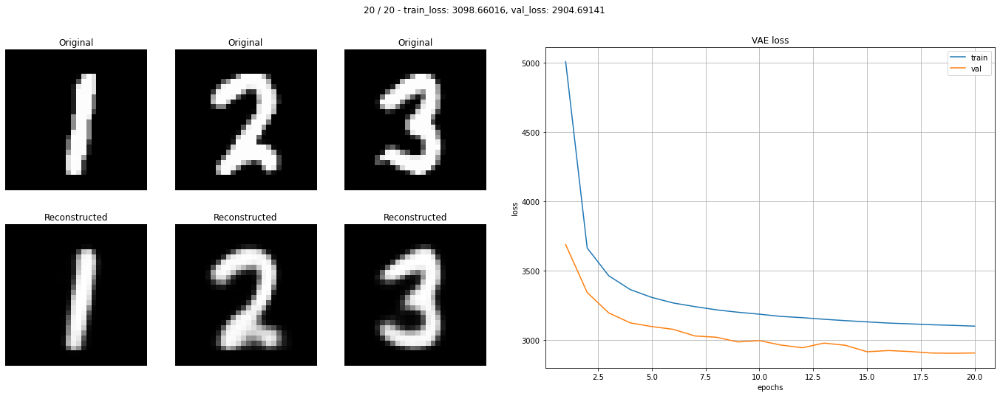

CPU times: user 6min 4s, sys: 2.31 s, total: 6min 7s
Wall time: 6min 6s


In [62]:
%%time
cvae_conv = CVAEconv(features).to(device)
optimizer = optim.AdamW(cvae_conv.parameters())
losses_cvae_conv_train, losses_cvae_conv_val = train_cvae(cvae_conv, optimizer, criterion, 20, train_loader, val_loader)

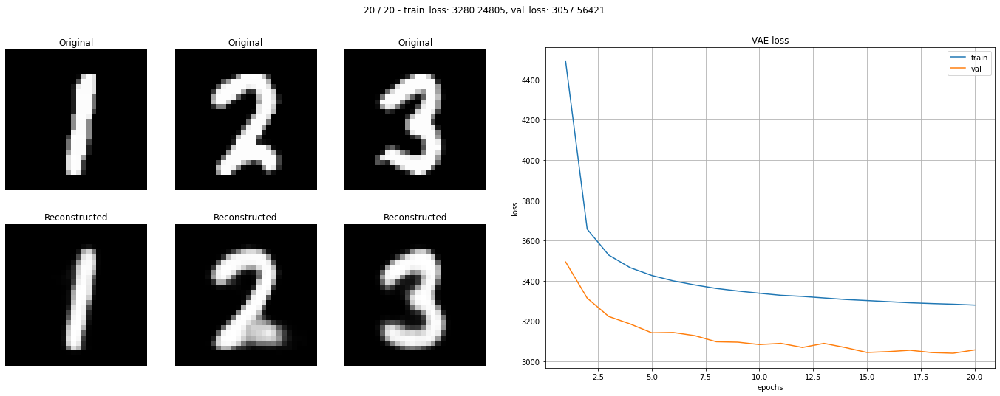

CPU times: user 4min 7s, sys: 2.49 s, total: 4min 9s
Wall time: 4min 8s


In [63]:
%%time
cvae_lin = CVAElin(features).to(device)
optimizer = optim.AdamW(cvae_lin.parameters())
losses_cvae_lin_train, losses_cvae_lin_val = train_cvae(cvae_lin, optimizer, criterion, 20, train_loader, val_loader)

### Sampling


Тут мы будем сэмплировать из CVAE. Это прикольнее, чем сэмплировать из простого AE/VAE: тут можно взять один и тот же латентный вектор и попросить CVAE восстановить из него картинки разных классов!
Для MNIST вы можете попросить CVAE восстановить из одного латентного вектора, например, картинки цифры 5 и 7.

#### Conv CVAE

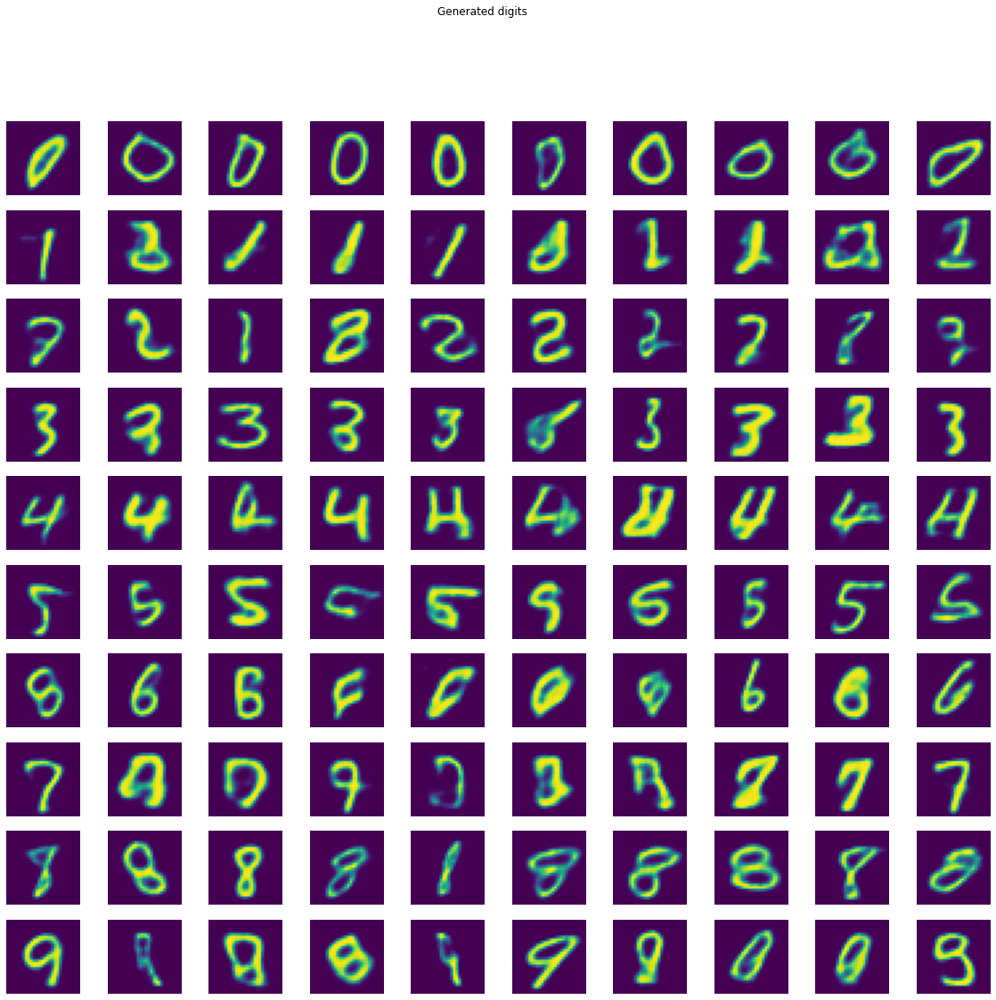

In [64]:
# сгенерируем по 10 экземпляров каждой цифры
z = torch.FloatTensor([np.random.normal(0, 1, features) for i in range(100)]).view(-1, features, 1, 1).to(device)
nums = torch.zeros(100, 10).view(-1, 10, 1, 1).to(device)
for i in range(10):
    for j in range(10):
        nums[10 * i + j, i] = 1
output = cvae_conv.decode(z, nums)
show_sampling(100, 20, 18, 10, 10, output, "MNIST")

#### Linear CVAE

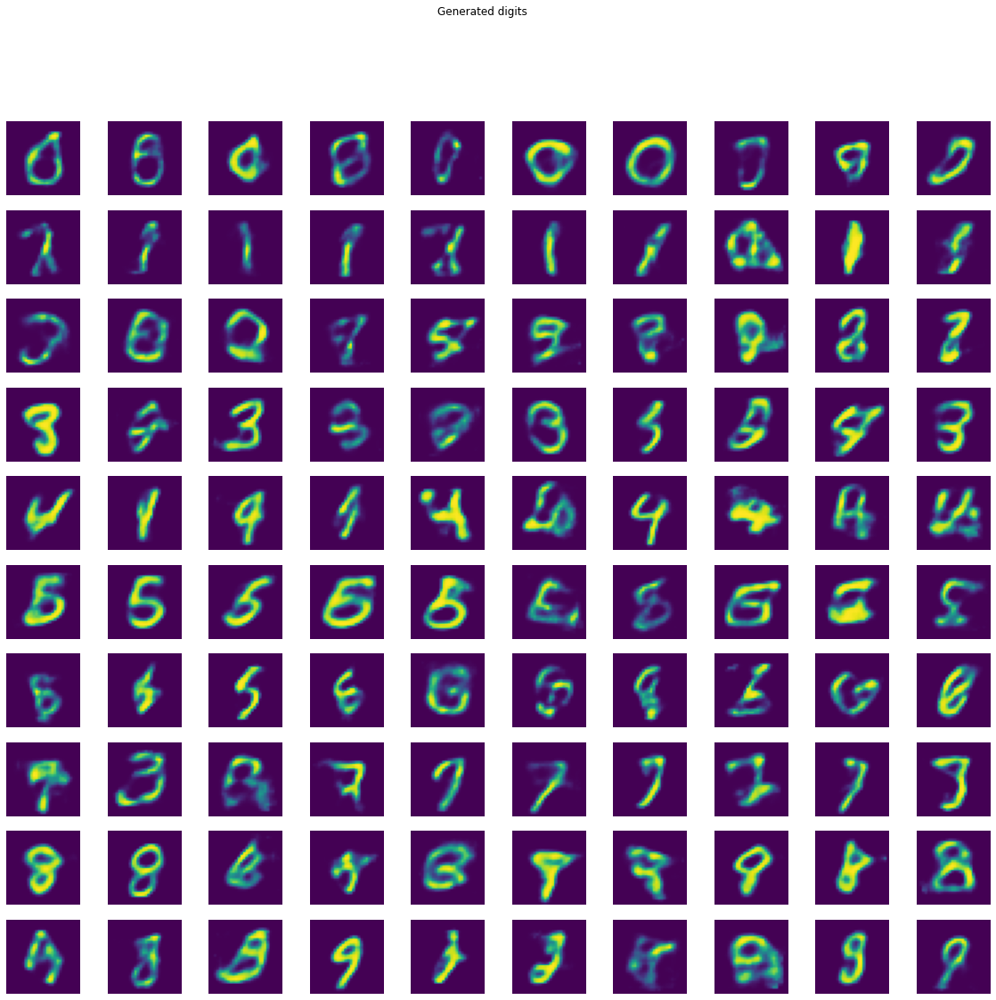

In [65]:
z = torch.FloatTensor([np.random.normal(0, 1, features) for i in range(100)])
nums = torch.zeros(100, 10)
for i in range(10):
    for j in range(10):
        nums[10 * i + j, i] = 1
output = cvae_lin.decode(z.to(device), nums.to(device)).view(-1, 1, 28, 28)
show_sampling(100, 20, 18, 10, 10, output, "MNIST")

Splendid! Вы великолепны!


### Latent Representations

Давайте посмотрим, как выглядит латентное пространство картинок в CVAE и сравним с картинкой для VAE =)

Опять же, нужно покрасить точки в разные цвета в зависимости от класса.

#### Conv CVAE

In [66]:
lat_space_cvae_conv = np.zeros((len(val_dataset), features))
lat_labels_cvae_conv = np.zeros(len(val_dataset), dtype='int')

cvae_conv.eval()
with torch.no_grad():
    for ind, X_val in enumerate(val_dataset):
        mu, logsigma = cvae_conv.encode(X_val[0].unsqueeze(0).to(device))
        lat_vec = cvae_conv.gaussian_sampler(mu, logsigma).cpu().numpy()
        lat_space_cvae_conv[ind] = lat_vec
        lat_labels_cvae_conv[ind] = X_val[1]

In [67]:
lat_space_embedded_cvae_conv = TSNE(n_components=2).fit_transform(lat_space_cvae_conv)
print(lat_space_embedded_cvae_conv.shape)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


(10000, 2)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if __name__ == '__main__':


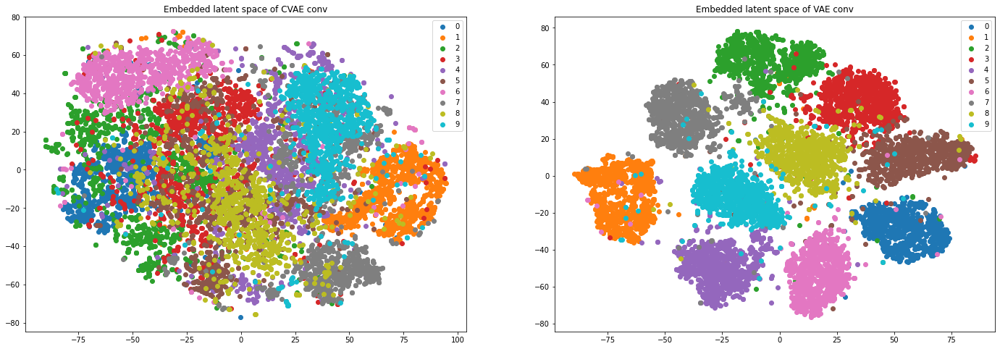

In [68]:
plt.figure(figsize=(24, 8))
for i in range(10):
    plt.subplot(1, 2, 1)
    indices = lat_labels_cvae_conv == i
    plt.scatter(x=lat_space_embedded_cvae_conv[indices, 0], y=lat_space_embedded_cvae_conv[indices, 1], label=str(i))
    plt.title('Embedded latent space of CVAE conv')
    plt.legend()

    plt.subplot(1, 2, 2)
    indices = lat_labels_vae_conv == i
    plt.scatter(x=lat_space_embedded_vae_conv[indices, 0], y=lat_space_embedded_vae_conv[indices, 1], label=str(i))
    plt.title('Embedded latent space of VAE conv')
    plt.legend()
plt.show()   

**Классы находятся намного кучнее. Но они очень сильно смешаны. Возможно, стоит поиграть с коэффициентом перед KL дивергенцией в лоссе, а также передевать вектор класса в каждый слой**

#### Linear CVAE

In [69]:
lat_space_cvae_lin = np.zeros((len(val_dataset), features))
lat_labels_cvae_lin = np.zeros(len(val_dataset), dtype='int')

cvae_lin.eval()
with torch.no_grad():
    for ind, X_val in enumerate(val_dataset):
        mu, logsigma = cvae_lin.encode(cvae_lin.flatten(X_val[0].to(device)))
        lat_vec = cvae_lin.gaussian_sampler(mu, logsigma).cpu().numpy()
        lat_space_cvae_lin[ind] = lat_vec
        lat_labels_cvae_lin[ind] = X_val[1]

In [70]:
lat_space_embedded_cvae_lin = TSNE(n_components=2).fit_transform(lat_space_cvae_lin)
print(lat_space_embedded_cvae_lin.shape)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


(10000, 2)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if __name__ == '__main__':


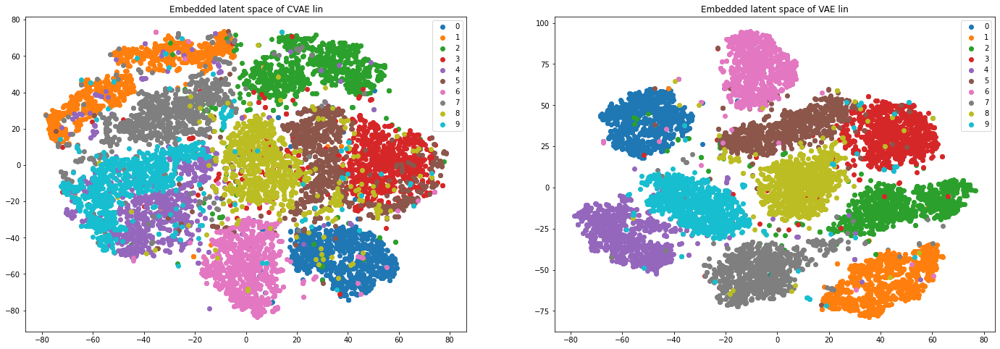

In [71]:
plt.figure(figsize=(24, 8))
for i in range(10):
    plt.subplot(1, 2, 1)
    indices = lat_labels_cvae_lin == i
    plt.scatter(x=lat_space_embedded_cvae_lin[indices, 0], y=lat_space_embedded_cvae_lin[indices, 1], label=str(i))
    plt.title('Embedded latent space of CVAE lin')
    plt.legend()

    plt.subplot(1, 2, 2)
    indices = lat_labels_vae_lin == i
    plt.scatter(x=lat_space_embedded_vae_lin[indices, 0], y=lat_space_embedded_vae_lin[indices, 1], label=str(i))
    plt.title('Embedded latent space of VAE lin')
    plt.legend()
plt.show()

Что вы думаете насчет этой картинки? Отличается от картинки для VAE?
**Отличается, классы находятся ближе друг к другу. Классы находятся ближе друг к другу, но они смешаны сильнее**

# BONUS 1: Denoising

## Внимание! За бонусы доп. баллы не ставятся, но вы можете сделать их для себя.

У автоэнкодеров, кроме сжатия и генерации изображений, есть другие практические применения. Про одно из них эта бонусная часть задания.

Автоэнкодеры могут быть использованы для избавления от шума на фотографиях (denoising). Для этого их нужно обучить специальным образом: input картинка будет зашумленной, а выдавать автоэнкодер должен будет картинку без шума. 
То есть, loss-функция AE останется той же (MSE между реальной картинкой и выданной), а на вход автоэнкодеру будет подаваться зашумленная картинка.

<a href="https://ibb.co/YbRJ1nZ"><img src="https://i.ibb.co/0QD164t/Screen-Shot-2020-06-04-at-4-49-50-PM.png" alt="Screen-Shot-2020-06-04-at-4-49-50-PM" border="0"></a>

Для этого нужно взять ваш любимый датасет (датасет лиц из первой части этого задания или любой другой) и сделать копию этого датасета с шумом. 

В питоне шум можно добавить так:

In [72]:
train_photos, val_photos= train_test_split(data, test_size=0.2, shuffle=True)

train_photos = torch.from_numpy(train_photos).float()
val_photos = torch.from_numpy(val_photos).float()

batch_size = 16
train_loader = data_utils.DataLoader(train_photos, batch_size=batch_size, shuffle=True, drop_last=True)
val_loader = data_utils.DataLoader(val_photos, batch_size=batch_size, shuffle=False, drop_last=True)

In [73]:
#<тут Ваш код тренировки автоэнкодера>

def train_ae_noise(model, optimizer, loss, n_epochs, train_loader, val_loader, noise_factor=0.5):

    train_losses = []
    val_losses = []
    
    #in order to produce constant noise for train and val we will create corresponding noise tensors
    noise_tensor_train = torch.normal(mean=0.0, std=1.0, size=[16, 64, 64, 3]).to(device)
    noise_tensor_val = torch.normal(mean=0.0, std=1.0, size=[16, 64, 64, 3]).to(device)

    for epoch in range(n_epochs):
        print(f"Epoch #{epoch+1} of {n_epochs}")

        model.train()
        train_loss_per_epoch = []
        for X_train in train_loader:
            X_train = X_train.to(device)
            X_train_noisy = X_train + noise_factor * noise_tensor_train
            optimizer.zero_grad()
            pred = model(X_train_noisy)[0]
            loss = criterion(pred, X_train)
            loss.backward()
            optimizer.step()
            train_loss_per_epoch.append(loss.detach().cpu().numpy())
        
        train_losses.append(np.mean(train_loss_per_epoch))
        #lr_sched.step()

        model.eval()
        val_loss_per_epoch = []
        with torch.no_grad():
            for X_val in val_loader:
                X_val = X_val.to(device)
                X_val_noisy = X_val + noise_factor * noise_tensor_val
                pred = model(X_val_noisy)[0]
                loss = criterion(pred, X_val)
                val_loss_per_epoch.append(loss.detach().cpu().numpy())
        val_losses.append(np.mean(val_loss_per_epoch))
        
        #show intermediate predictions
        clear_output(wait=True)
        show_intermediate_results(X_val, pred, n_epochs, epoch, train_losses, val_losses, "MSE loss")
    
    return (train_losses, val_losses)

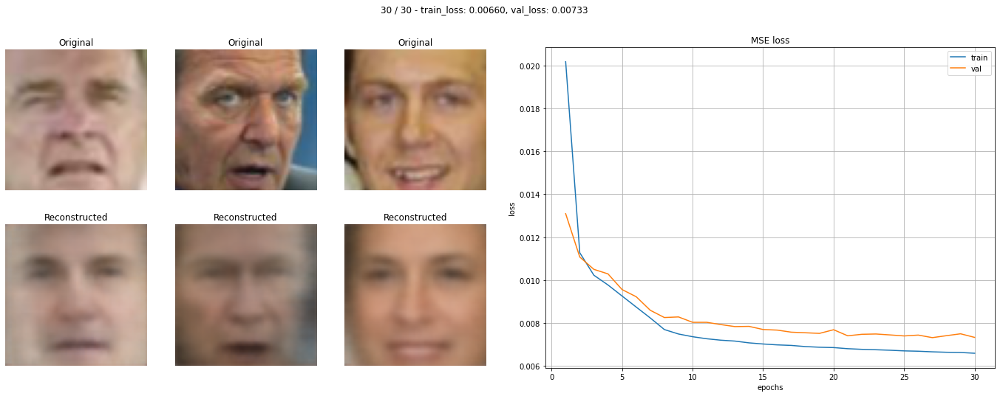

CPU times: user 2min 52s, sys: 1.47 s, total: 2min 53s
Wall time: 2min 53s


In [74]:
%%time
criterion = nn.MSELoss()
autoencoder_conv_noise = AutoencoderConv(features).to(device)
optimizer = optim.AdamW(autoencoder_conv_noise.parameters())
losses_conv_train_noise, losses_conv_val_noise = train_ae_noise(autoencoder_conv_noise, optimizer, criterion, 30, train_loader, val_loader, 0.5)

In [75]:
noise_factor = 0.2
preds = []
noisy_photos = val_photos.to(device) + noise_factor * torch.normal(mean=0.0, std=1.0, size=val_photos.shape).to(device)
with torch.no_grad():
    for noisy_photo in tqdm(noisy_photos):
        pred, _ = autoencoder_conv(noisy_photo.unsqueeze(0).to(device))
        preds.extend(pred.cpu().detach().numpy()) 

  0%|          | 0/2629 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


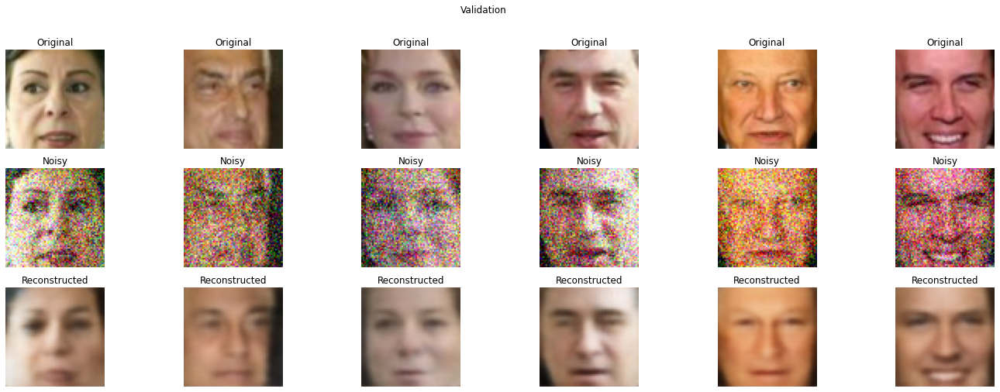

In [76]:
num_examples = 6 
plt.figure(figsize=(24, 8))
for i in range(num_examples):
    plt.subplot(3, num_examples, i + 1)
    plt.imshow(val_photos[i].detach().numpy())
    plt.title("Original")
    plt.axis('off')
    
    plt.subplot(3, num_examples, i + 1 + num_examples)
    plt.imshow(noisy_photos[i].detach().cpu().numpy())
    plt.title("Noisy")
    plt.axis('off')

    plt.subplot(3, num_examples, i + 1 + 2 * num_examples)
    plt.imshow(preds[i])
    plt.title("Reconstructed")
    plt.axis('off')
plt.suptitle("Validation")
plt.show()

# BONUS 2: Image Retrieval

## Внимание! За бонусы доп. баллы не ставятся, но вы можете сделать их для себя.

Давайте представим, что весь наш тренировочный датасет -- это большая база данных людей. И вот мы получили картинку лица какого-то человека с уличной камеры наблюдения (у нас это картинка из тестового датасета) и хотим понять, что это за человек. Что нам делать? Правильно -- берем наш VAE, кодируем картинку в латентное представление и ищем среди латентныз представлений лиц нашей базы самые ближайшие!

План:

1. Получаем латентные представления всех лиц тренировочного датасета
2. Обучаем на них LSHForest `(sklearn.neighbors.LSHForest)`, например, с `n_estimators=50`
3. Берем картинку из тестового датасета, с помощью VAE получаем ее латентный вектор
4. Ищем с помощью обученного LSHForest ближайшие из латентных представлений тренировочной базы
5. Находим лица тренировочного датасета, которым соответствуют ближайшие латентные представления, визуализируем!

Немного кода вам в помощь: (feel free to delete everything and write your own)

In [77]:
# немного переделаем архитектуру для другого размера картинки
class VAEconvRetrieval(nn.Module):
    def __init__(self, features=16):
        super().__init__()
        
        self.features = features
        
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 8, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(8, 16, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(16, 32, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(32, 64, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(64, 32, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(32, self.features * 2, kernel_size=4, stride=2, padding=1)
        )
        
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(self.features, 32, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(32, 64, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(64, 32, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(32, 16, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(16, 8, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(8, 3, kernel_size=4, stride=2, padding=1),
        )
    def encode(self, x):
        x = self.encoder(x)
        mu = x[:, :self.features].view(-1, self.features)
        logsigma = x[:, self.features:(2 * self.features)].view(-1, self.features)
        
        return mu, logsigma
    
    def gaussian_sampler(self, mu, logsigma):
        if self.training:
            std = torch.exp(0.5 * logsigma)
            eps = torch.randn_like(std)
            return mu + eps * std
        else:
            return mu
    
    def decode(self, z):
        reconstruction = torch.sigmoid(self.decoder(z))
        return reconstruction
    
    def get_latent_vec(self, z):
        mu, logsigma = self.encode(z)
        sample = self.gaussian_sampler(mu, logsigma)
        return sample
    
    def forward(self, x):
        mu, logsigma = self.encode(x.permute(0, 3, 1, 2))
        sample = self.gaussian_sampler(mu, logsigma)
        reconstruction = self.decode(sample.view(-1, self.features, 1, 1)).permute(0, 2, 3, 1)
        return mu, logsigma, reconstruction

In [78]:
#<тут Ваш код тренировки автоэнкодера>

def train_vae_retrieval(model, optimizer, loss, n_epochs, train_loader, val_loader):

    train_losses = []
    val_losses = []

    for epoch in range(n_epochs):
        print(f"Epoch #{epoch+1} of {n_epochs}")

        model.train()
        train_loss_per_epoch = []
        for X_train in train_loader:
            X_train = X_train.to(device)
            optimizer.zero_grad()
            mu, logsigma, reconstruction = model(X_train)
            loss = criterion(X_train, mu, logsigma, reconstruction)
            loss.backward()
            optimizer.step()
            train_loss_per_epoch.append(loss.detach().cpu().numpy())
        
        train_losses.append(np.mean(train_loss_per_epoch))
        #lr_sched.step()

        model.eval()
        val_loss_per_epoch = []
        with torch.no_grad():
            for X_val in val_loader:
                X_val = X_val.to(device)
                mu, logsigma, reconstruction = model(X_val)
                loss = criterion(X_val, mu, logsigma, reconstruction)
                val_loss_per_epoch.append(loss.detach().cpu().numpy())
        val_losses.append(np.mean(val_loss_per_epoch))
        
        #show intermediate predictions
        clear_output(wait=True)
        show_intermediate_results(X_val, reconstruction, n_epochs, epoch, train_losses, val_losses, "VAE loss")
    
    return (train_losses, val_losses)

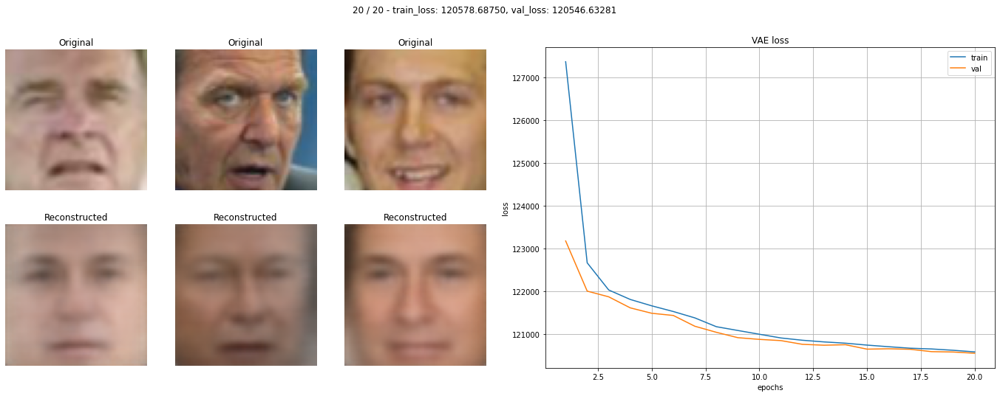

CPU times: user 1min 56s, sys: 1.02 s, total: 1min 57s
Wall time: 1min 57s


In [79]:
%%time
vae_conv_retrieval = VAEconvRetrieval(features).to(device)
criterion = loss_vae
optimizer = optim.AdamW(vae_conv_retrieval.parameters())
losses_vae_retrieval_train, losses_vae_retrieval_val = train_vae_retrieval(vae_conv_retrieval, optimizer, criterion, 20, train_loader, val_loader)

In [80]:
# получаем латентные представления лиц тестового датасета
lat_space_vae_conv_retrieval = np.zeros((len(train_photos), features))

vae_conv_retrieval.eval()
with torch.no_grad():
    for ind, X_train in enumerate(train_photos):
        mu, logsigma = vae_conv_retrieval.encode(X_train.unsqueeze(0).permute(0, 3, 1, 2).to(device))
        lat_vec = vae_conv_retrieval.gaussian_sampler(mu, logsigma).cpu().numpy()
        lat_space_vae_conv_retrieval[ind] = lat_vec

In [81]:
from sklearn.neighbors import NearestNeighbors
knn = NearestNeighbors().fit(lat_space_vae_conv_retrieval)

In [82]:
def get_similar(image, model, estimator, n_neighbors=5):
    # функция, которая берет тестовый image и с помощью метода kneighbours у LSHForest ищет ближайшие векторы
    # прогоняет векторы через декодер и получает картинки ближайших людей
    
    mu, logsigma = model.encode(image.unsqueeze(0).permute(0, 3, 1, 2).to(device))
    lat_vec = model.gaussian_sampler(mu, logsigma).detach().cpu().numpy()
    
    distances, idx = estimator.kneighbors(lat_vec, n_neighbors=n_neighbors, return_distance=True)

    return distances, train_photos[idx]

In [83]:
def show_similar(image):

  # функция, которая принимает тестовый image, ищет ближайшие к нему и визуализирует результат
    
    distances,neighbors = get_similar(image, vae_conv_retrieval, knn, n_neighbors=11)
    
    plt.figure(figsize=[16, 12])
    plt.subplot(3,4,1)
    plt.imshow(image.cpu().numpy())
    plt.title("Original image")
    
    for i in range(11):
        plt.subplot(3,4,i+2)
        plt.imshow(neighbors[i].cpu().numpy())
        plt.title("Dist=%.3f"%distances[0][i])
    plt.show()

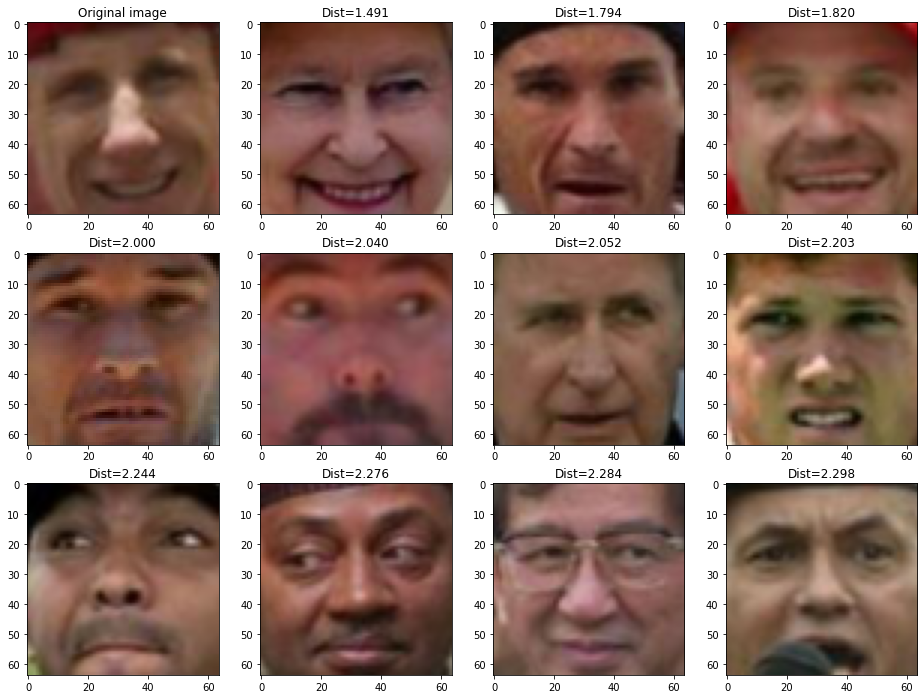

In [84]:
show_similar(val_photos[10])

**Первые 5 предсказанных картинок сильно схожи с оригинальной, что не может не радовать**

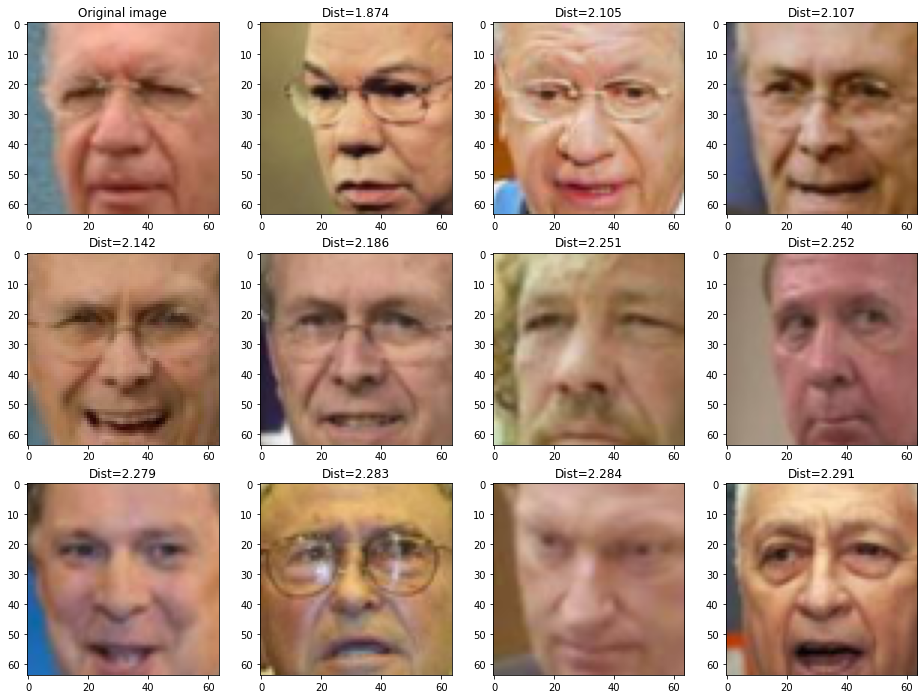

In [85]:
show_similar(val_photos[100])

**В данном случае почти все картинки схожи с изначальной** 

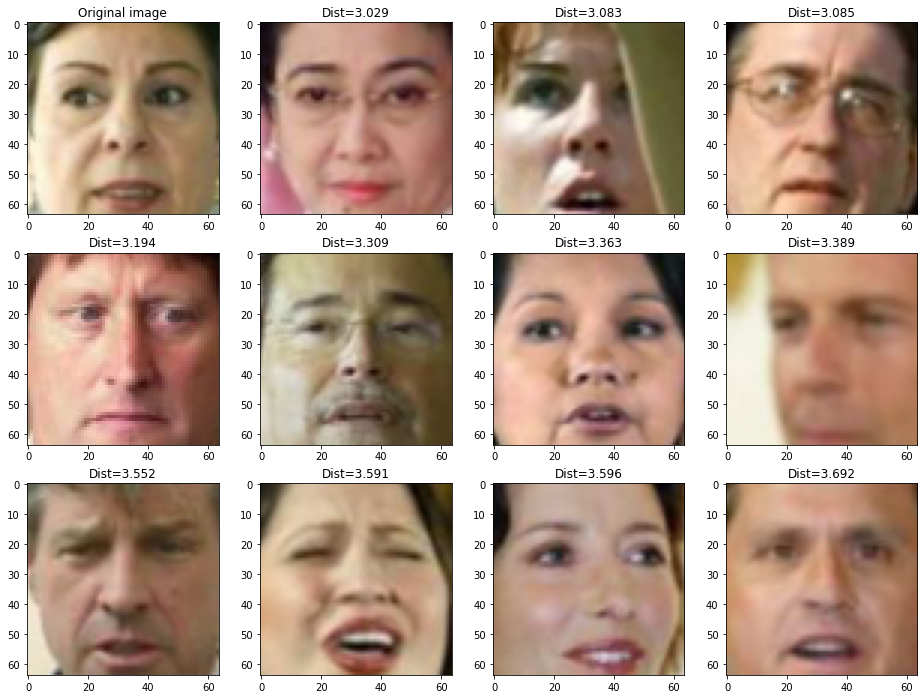

In [86]:
show_similar(val_photos[0])